# Life Expectancy Prediction

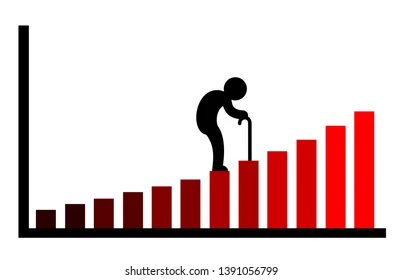

## About Dataset 
<b>Total Columns = 22<b><br>
<b>Total Rows = 2938<b><br>
<b>Columns <b><br>
   * <b>Country<b> : Country Names (193 Unique Contries name)<br>
   * <b>Year<b> : Year (2000 - 2013)<br>
   * <b>Status<b> : Developed or Developing status<br>
   * <b>Life expectancy<b> : Life Expectancy in age<br>
   * <b>Adult Mortality<b> : Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)<br>
   * <b>infant deaths<b> : Number of Infant Deaths per 1000 population<br>
   * <b>Alcohol<b> : Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol)<br>
   * <b>percentage expenditure<b> : Expenditure on health as a percentage of Gross Domestic Product per capita(%)<br>
   * <b>Hepatitis B<b> : Hepatitis B (HepB) immunization coverage among 1-year-olds (%)<br>
   * <b>Measles<b> : Measles - number of reported cases per 1000 population<br>
   * <b>BMI<b> : Average Body Mass Index of entire population<br>
   * <b>under-five deaths<b> : Number of under-five deaths per 1000 population<br>
   * <b>Polio<b> : Polio (Pol3) immunization coverage among 1-year-olds (%)<br>
   * <b>Total expenditure<b> : General government expenditure on health as a percentage of total government expenditure (%)<br>
   * <b>Diphtheria<b> : Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)<br>
   * <b>HIV/AIDS<b> : Deaths per 1 000 live births HIV/AIDS (0-4 years)<br>
   * <b>GDP<b> : Gross Domestic Product per capita (in USD)<br>
   * <b>Population<b> : Population of the country<br>
   * <b>thinness 1-19 years<b> : Prevalence of thinness among children and adolescents for Age 10 to 19 (% )
   * <b>thinness 5-9 years<b> : Prevalence of thinness among children for Age 5 to 9(%)<br>
   * <b>Income composition of resources<b> : Human Development Index in terms of income composition of resources (index ranging from 0 to 1)<br>
   * <b>Schooling<b> : Number of years of Schooling(years)<br>

   * <b>Dataset Link<b> : https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who

## import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import OrdinalEncoder, FunctionTransformer, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score

## My Functions

In [2]:
def graph(df, columnName):
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 2, 1)
    plt.title("Box Plot")
    sns.boxplot(data=df[columnName])

    plt.subplot(2, 2, 2)
    plt.title("Histogram")
    sns.histplot(data=df[columnName])

    plt.subplot(2, 2, 3)
    plt.title("KDE Plot")
    sns.kdeplot(data=df[columnName])

    plt.subplot(2, 2, 4)
    plt.title("Scatter Plot")
    sns.scatterplot(data=df, x="Life expectancy ", y=columnName, hue="Status")

    plt.show()

In [3]:
def cap(df_old, df):
    cols = df.columns
    for i in range(3, len(cols)):
        columnName = cols[i]
        persentile25 = df_old[columnName].quantile(0.25)
        persentile75 = df_old[columnName].quantile(0.75)
        iqr = persentile75 - persentile25
        upper_limit = persentile75 + 1.5 * iqr
        lower_limit = persentile25 - 1.5 * iqr
        print("#########################################################################")
        print("\nVariable Name : ", columnName)
        
        if ((df[columnName] > upper_limit).any() or (df[columnName] < lower_limit).any()):
            
            df[columnName] = np.where(
                df[columnName] > upper_limit, upper_limit,
                np.where(
                    df[columnName] < lower_limit, lower_limit,
                    df[columnName]
                )
            )

            print("Persentile 25 : ", persentile25)
            print("Persentile 75 : ", persentile75)
            print("IQR : ", iqr)
            print("Upper Limit : ", upper_limit)
            print("Lower Limit : ", lower_limit)
            print("Outliers Removed using IQR Method by Capping")

            plt.figure(figsize=(15, 20))
            plt.subplot(4, 2, 1)
            plt.title("Box Plot(Before capping)")
            sns.boxplot(data=df_old[columnName])

            plt.subplot(4, 2, 2)
            plt.title("Box Plot(After capping)")
            sns.boxplot(data=df[columnName])

            plt.subplot(4, 2, 3)
            plt.title("Histogram(Before capping)")
            sns.histplot(data=df_old[columnName])

            plt.subplot(4, 2, 4)
            plt.title("Histogram(After capping)")
            sns.histplot(data=df[columnName])

            plt.subplot(4, 2, 5)
            plt.title("KDE Plot(Before capping)")
            sns.kdeplot(data=df_old[columnName])

            plt.subplot(4, 2, 6)
            plt.title("KDE Plot(After capping)")
            sns.kdeplot(data=df[columnName])

            plt.subplot(4, 2, 7)
            plt.title("Scatter Plot(Before capping)")
            sns.scatterplot(data=df_old, x="Life expectancy ", y=columnName, hue="Status")

            plt.subplot(4, 2, 8)
            plt.title("Scatter Plot(After capping)")
            sns.scatterplot(data=df, x="Life expectancy ", y=columnName, hue="Status")

            plt.show()
        else:
            print("No Outliers found")

## Load the dataset

In [4]:
df = pd.read_csv("D:\Dataset\Life Expectancy Data.csv")

## Case study on the whole dataset

### Shape

In [5]:
df.shape

(2938, 22)

### Data Sample

In [6]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


### information of all Columns

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

### Null value count column wise

In [8]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

### Null value percentage

In [9]:
df.isnull().mean()*100

Country                             0.000000
Year                                0.000000
Status                              0.000000
Life expectancy                     0.340368
Adult Mortality                     0.340368
infant deaths                       0.000000
Alcohol                             6.603131
percentage expenditure              0.000000
Hepatitis B                        18.822328
Measles                             0.000000
 BMI                                1.157250
under-five deaths                   0.000000
Polio                               0.646698
Total expenditure                   7.692308
Diphtheria                          0.646698
 HIV/AIDS                           0.000000
GDP                                15.248468
Population                         22.191967
 thinness  1-19 years               1.157250
 thinness 5-9 years                 1.157250
Income composition of resources     5.684139
Schooling                           5.547992
dtype: flo

### Null values by heatmap

<AxesSubplot:>

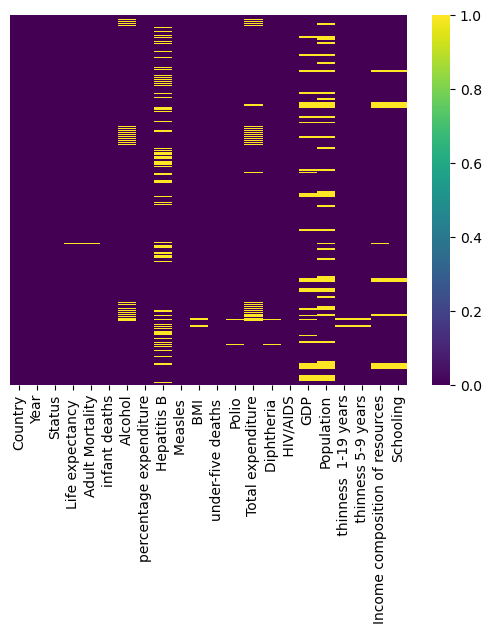

In [10]:
sns.heatmap(df.isnull(), yticklabels = False, cbar = True, cmap = 'viridis')

### Columns Desription

In [11]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


### Duplicate row count

In [12]:
df.duplicated().sum()

0

### Correlationn between each coloumns

In [13]:
df.corr()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
Life expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.296049,-0.013647,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.301557,-0.072301,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.112081,0.544423,0.467789,0.472263,-0.163305,-0.209373


### Correlation between each coloumns by heatmap

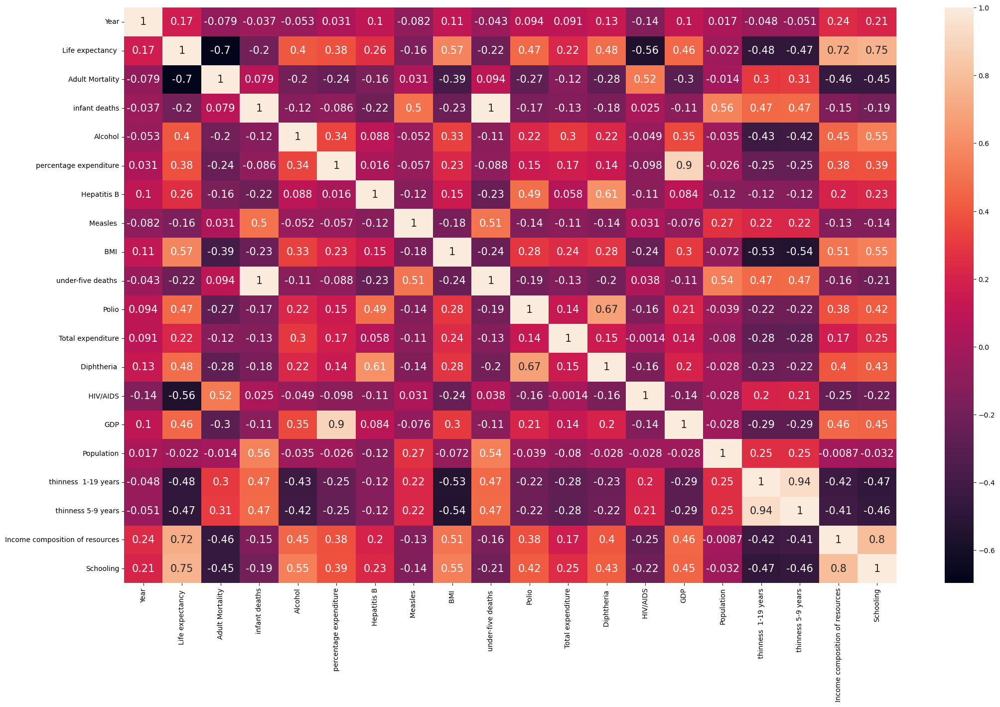

In [14]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(), annot = True, annot_kws = {"size":15})
plt.show()

### Correlation with <b>Life expectancy<b> 

In [15]:
df.corr()["Life expectancy "]

Year                               0.170033
Life expectancy                    1.000000
Adult Mortality                   -0.696359
infant deaths                     -0.196557
Alcohol                            0.404877
percentage expenditure             0.381864
Hepatitis B                        0.256762
Measles                           -0.157586
 BMI                               0.567694
under-five deaths                 -0.222529
Polio                              0.465556
Total expenditure                  0.218086
Diphtheria                         0.479495
 HIV/AIDS                         -0.556556
GDP                                0.461455
Population                        -0.021538
 thinness  1-19 years             -0.477183
 thinness 5-9 years               -0.471584
Income composition of resources    0.724776
Schooling                          0.751975
Name: Life expectancy , dtype: float64

## Case study on every veriable of the dataset

### Country (catagorical)

In [16]:
df["Country"].value_counts()

Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: Country, Length: 193, dtype: int64

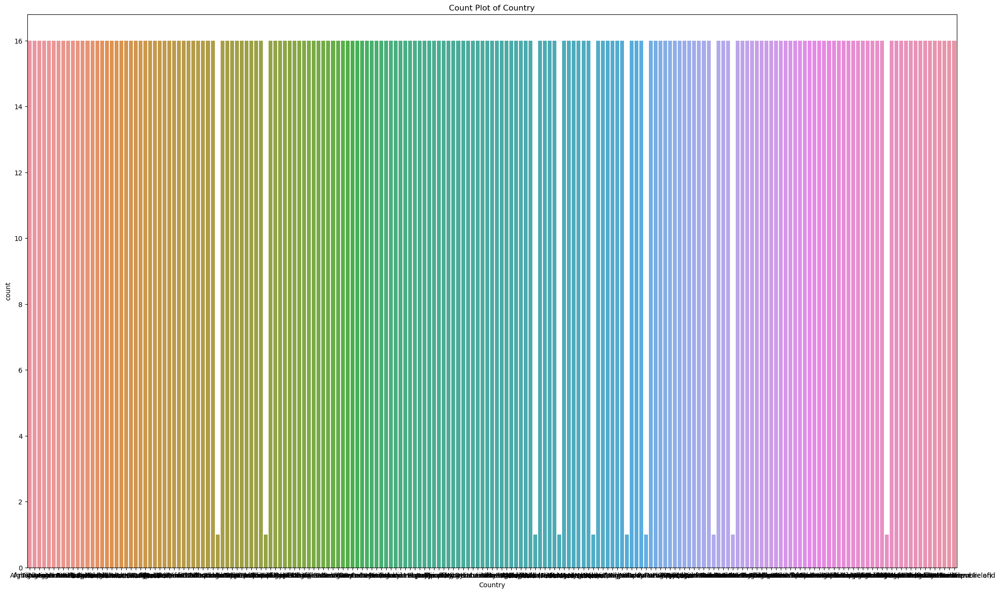

In [17]:
plt.figure(figsize=(25,15))
plt.title("Count Plot of Country")
sns.countplot(data=df, x="Country")
plt.show()

In [18]:
df["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

### Year (catagorical)

In [19]:
df["Year"].value_counts()

2013    193
2015    183
2014    183
2012    183
2011    183
2010    183
2009    183
2008    183
2007    183
2006    183
2005    183
2004    183
2003    183
2002    183
2001    183
2000    183
Name: Year, dtype: int64

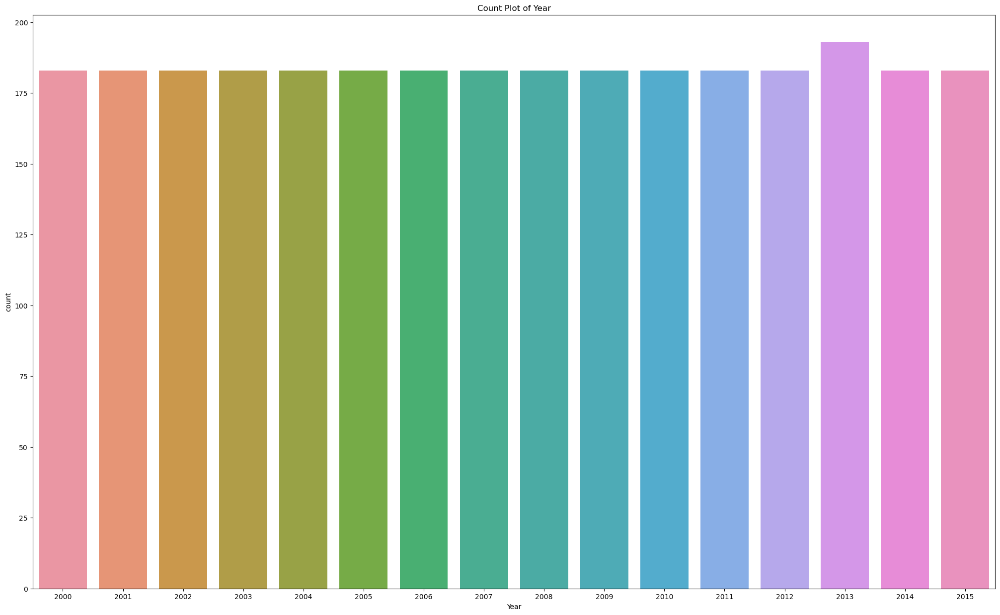

In [20]:
plt.figure(figsize=(25,15))
plt.title("Count Plot of Year")
sns.countplot(data=df, x="Year")
plt.show()

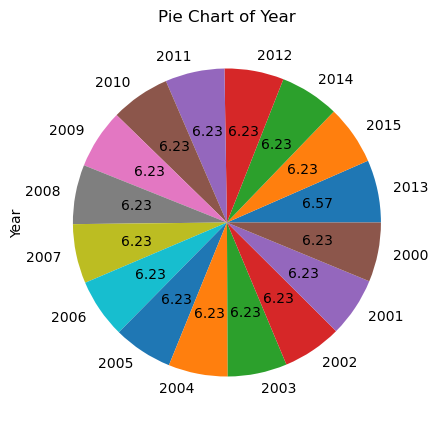

In [21]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Year")
df["Year"].value_counts().plot(kind="pie", autopct="%.2f")
plt.show()

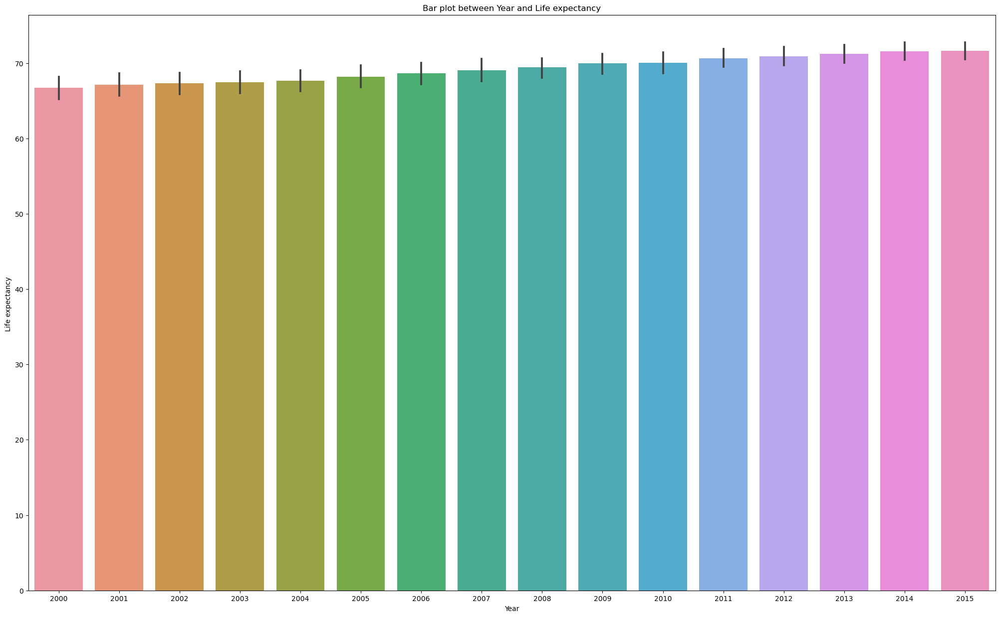

In [22]:
plt.figure(figsize=(25,15))
plt.title("Bar plot between Year and Life expectancy")
sns.barplot(data=df, x="Year", y="Life expectancy ")
plt.show()

### Status (catagorical)

In [23]:
df["Status"].value_counts()

Developing    2426
Developed      512
Name: Status, dtype: int64

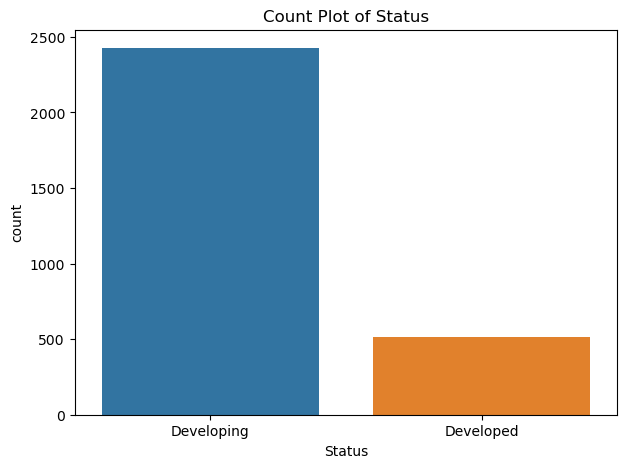

In [24]:
plt.figure(figsize=(7,5))
plt.title("Count Plot of Status")
sns.countplot(data=df, x="Status")
plt.show()

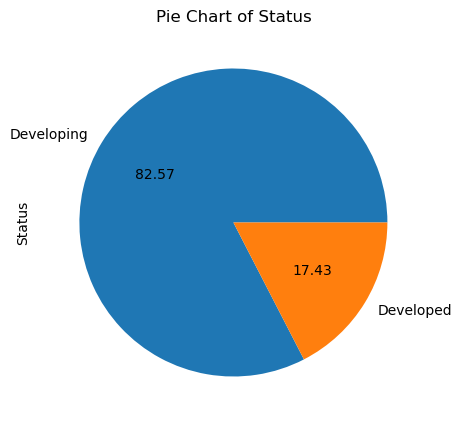

In [25]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Status")
df["Status"].value_counts().plot(kind="pie", autopct="%.2f")
plt.show()

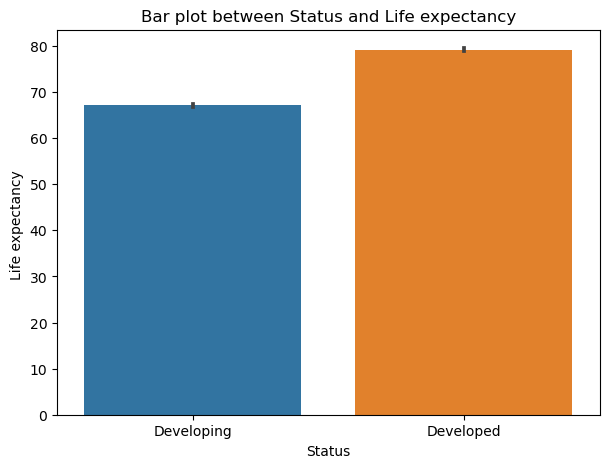

In [26]:
plt.figure(figsize=(7,5))
plt.title("Bar plot between Status and Life expectancy")
sns.barplot(data=df, x="Status", y="Life expectancy ")
plt.show()

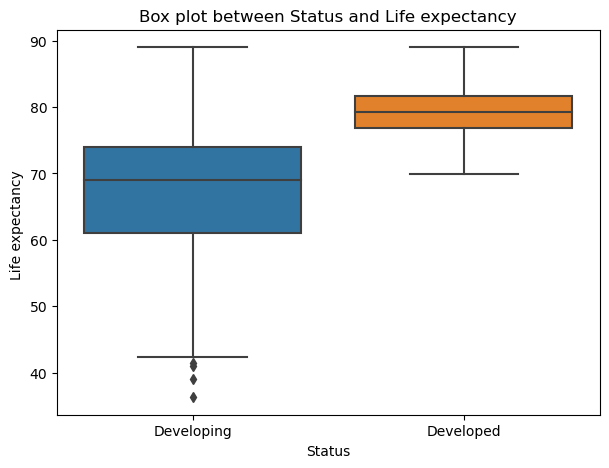

In [27]:
plt.figure(figsize=(7,5))
plt.title("Box plot between Status and Life expectancy")
sns.boxplot(data=df, x="Status", y="Life expectancy ")
plt.show()

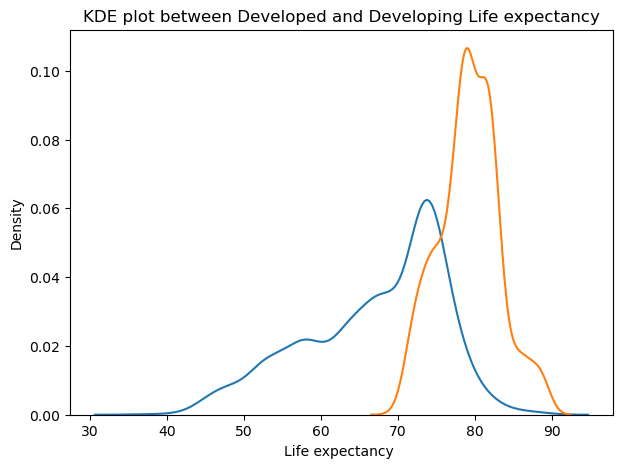

In [28]:
plt.figure(figsize=(7,5))
plt.title("KDE plot between Developed and Developing Life expectancy")
sns.kdeplot(df[df["Status"]=="Developing"]["Life expectancy "])
sns.kdeplot(df[df["Status"]=="Developed"]["Life expectancy "])
plt.show()

### Life expectancy (numerical)

In [29]:
df["Life expectancy "].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Life expectancy 
Non-Null Count  Dtype  
--------------  -----  
2928 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [30]:
df["Life expectancy "].describe()

count    2928.000000
mean       69.224932
std         9.523867
min        36.300000
25%        63.100000
50%        72.100000
75%        75.700000
max        89.000000
Name: Life expectancy , dtype: float64

In [31]:
df["Life expectancy "].isnull().sum()

10

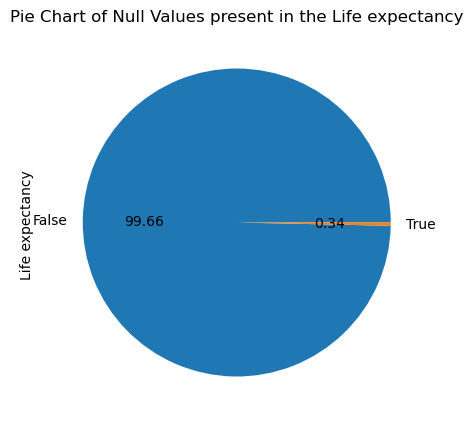

In [32]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Life expectancy")
df["Life expectancy "].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Life expectancy ")
plt.show()

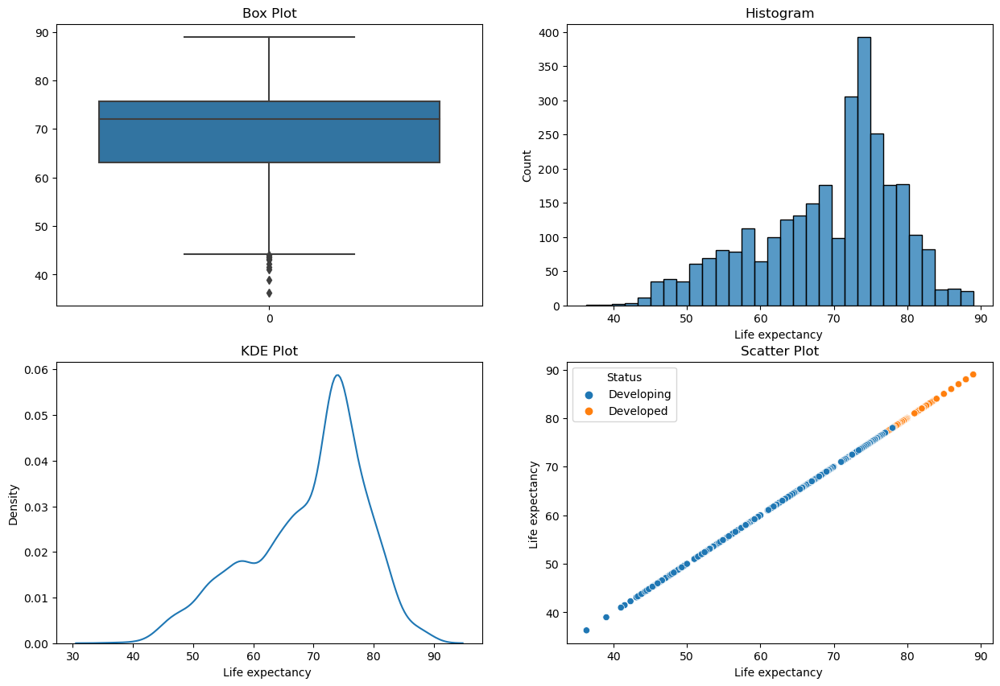

In [33]:
graph(df, "Life expectancy ")

### Adult Mortality (numerical)

In [34]:
df["Adult Mortality"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Adult Mortality
Non-Null Count  Dtype  
--------------  -----  
2928 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [35]:
df["Adult Mortality"].describe()

count    2928.000000
mean      164.796448
std       124.292079
min         1.000000
25%        74.000000
50%       144.000000
75%       228.000000
max       723.000000
Name: Adult Mortality, dtype: float64

In [36]:
df["Adult Mortality"].isnull().sum()

10

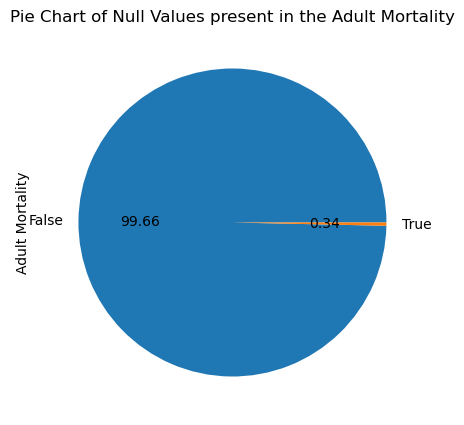

In [37]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Adult Mortality")
df["Adult Mortality"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Adult Mortality")
plt.show()

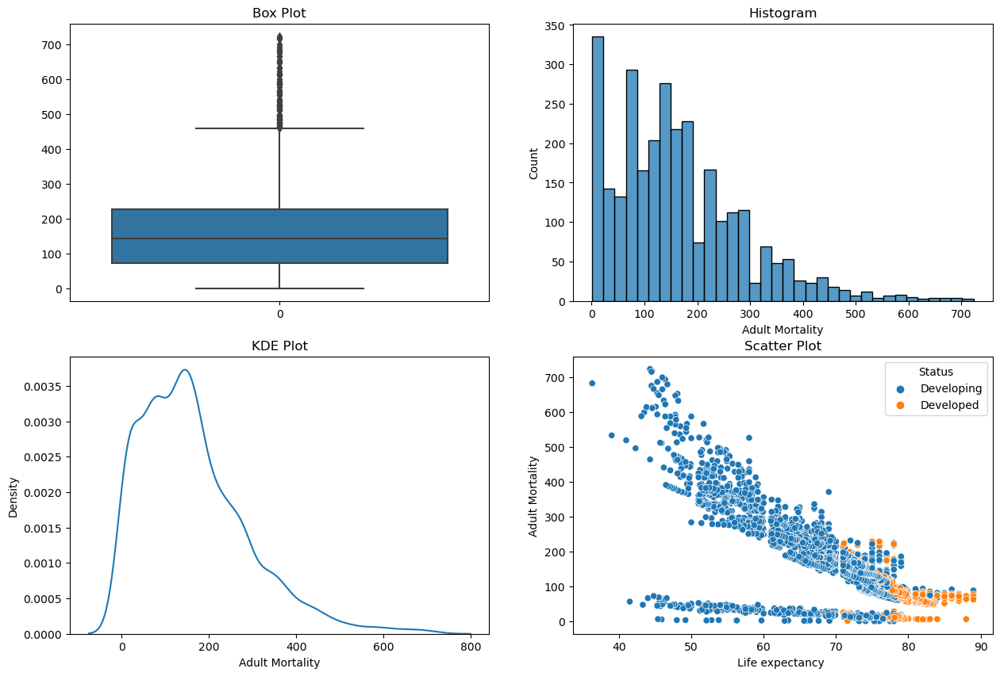

In [38]:
graph(df,"Adult Mortality")

### Infant deaths (numerical)

In [39]:
df["infant deaths"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: infant deaths
Non-Null Count  Dtype
--------------  -----
2938 non-null   int64
dtypes: int64(1)
memory usage: 23.1 KB


In [40]:
df["infant deaths"].describe()

count    2938.000000
mean       30.303948
std       117.926501
min         0.000000
25%         0.000000
50%         3.000000
75%        22.000000
max      1800.000000
Name: infant deaths, dtype: float64

In [41]:
df["infant deaths"].isnull().sum()

0

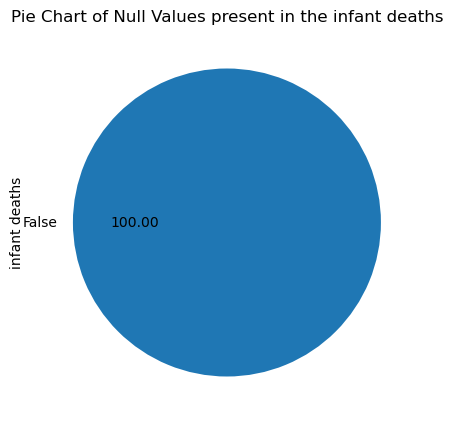

In [42]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the infant deaths")
df["infant deaths"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Adult Mortality")
plt.show()

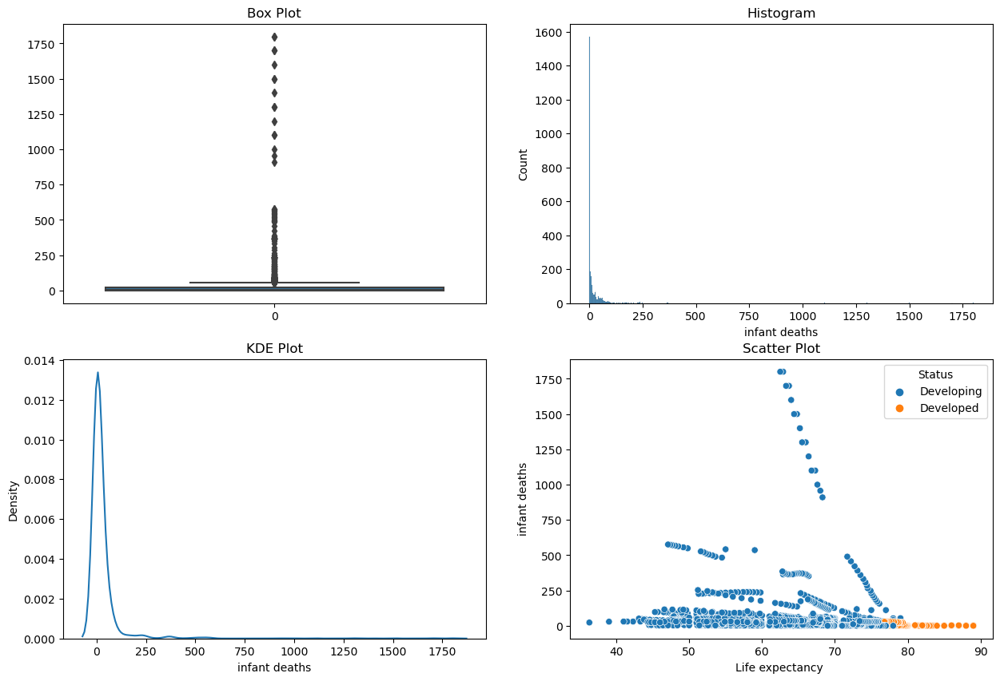

In [43]:
graph(df, "infant deaths")

### Alcohol (numerical)

In [44]:
df["Alcohol"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Alcohol
Non-Null Count  Dtype  
--------------  -----  
2744 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [45]:
df["Alcohol"].describe()

count    2744.000000
mean        4.602861
std         4.052413
min         0.010000
25%         0.877500
50%         3.755000
75%         7.702500
max        17.870000
Name: Alcohol, dtype: float64

In [46]:
df["Alcohol"].isnull().sum()

194

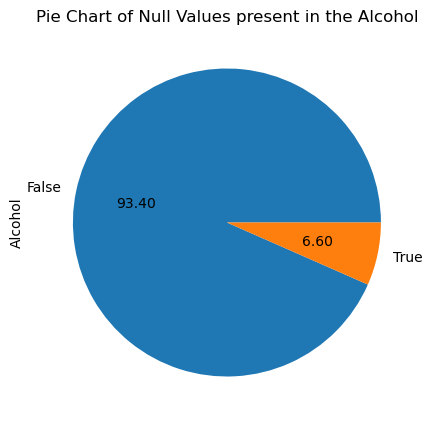

In [47]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Alcohol")
df["Alcohol"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Alcohol")
plt.show()

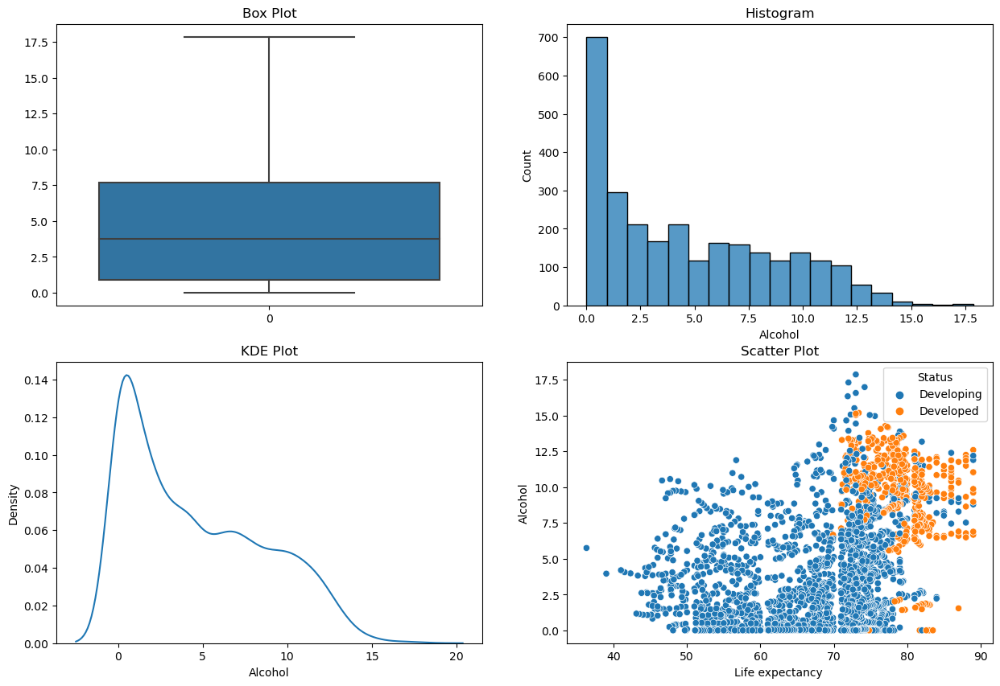

In [48]:
graph(df, "Alcohol")

### Percentage expenditure (numerical)

In [49]:
df["percentage expenditure"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: percentage expenditure
Non-Null Count  Dtype  
--------------  -----  
2938 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [50]:
df["percentage expenditure"].describe()

count     2938.000000
mean       738.251295
std       1987.914858
min          0.000000
25%          4.685343
50%         64.912906
75%        441.534144
max      19479.911610
Name: percentage expenditure, dtype: float64

In [51]:
df["percentage expenditure"].isnull().sum()

0

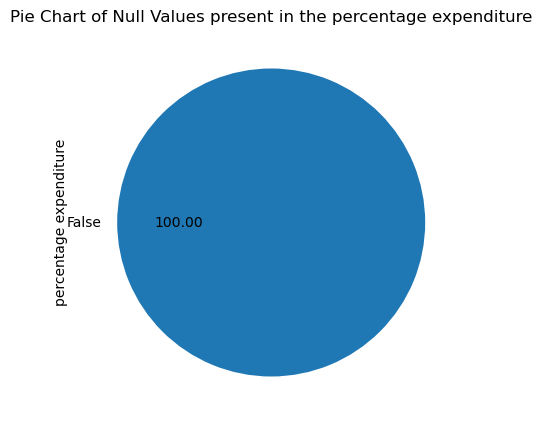

In [52]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the percentage expenditure")
df["percentage expenditure"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="percentage expenditure")
plt.show()

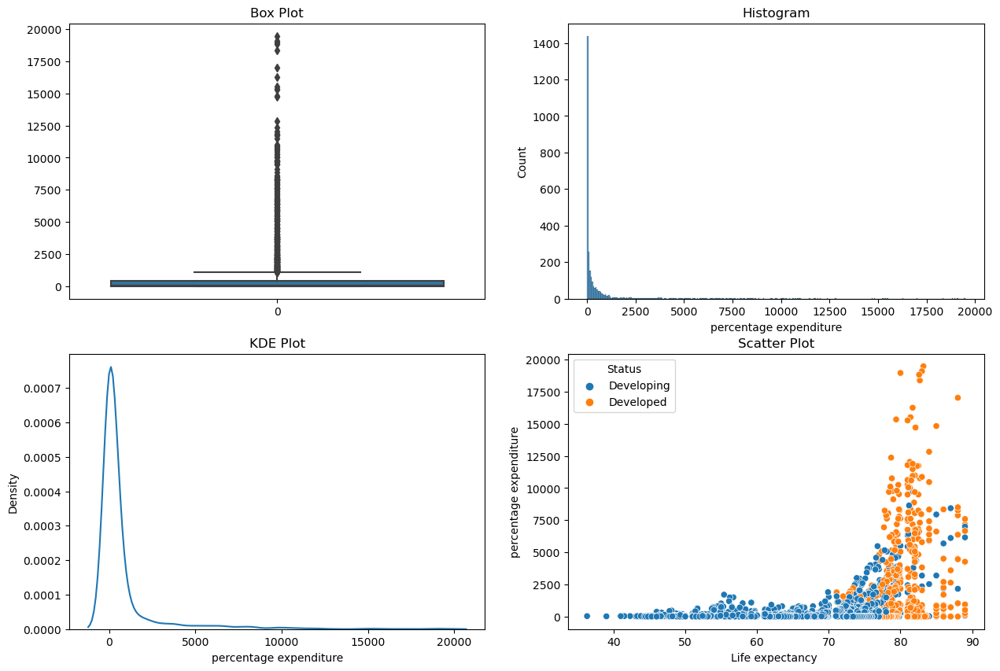

In [53]:
graph(df, "percentage expenditure")

### Hepatitis B (numerical)

In [54]:
df["Hepatitis B"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Hepatitis B
Non-Null Count  Dtype  
--------------  -----  
2385 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [55]:
df["Hepatitis B"].describe()

count    2385.000000
mean       80.940461
std        25.070016
min         1.000000
25%        77.000000
50%        92.000000
75%        97.000000
max        99.000000
Name: Hepatitis B, dtype: float64

In [56]:
df["Hepatitis B"].isnull().sum()

553

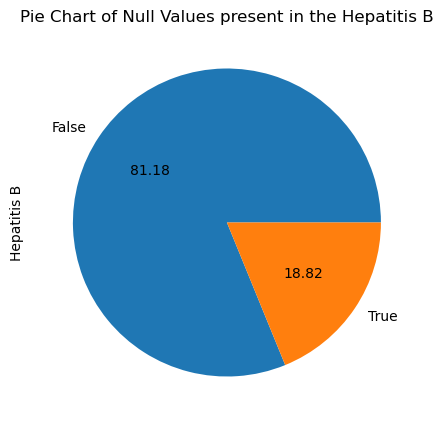

In [57]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Hepatitis B")
df["Hepatitis B"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Hepatitis B")
plt.show()

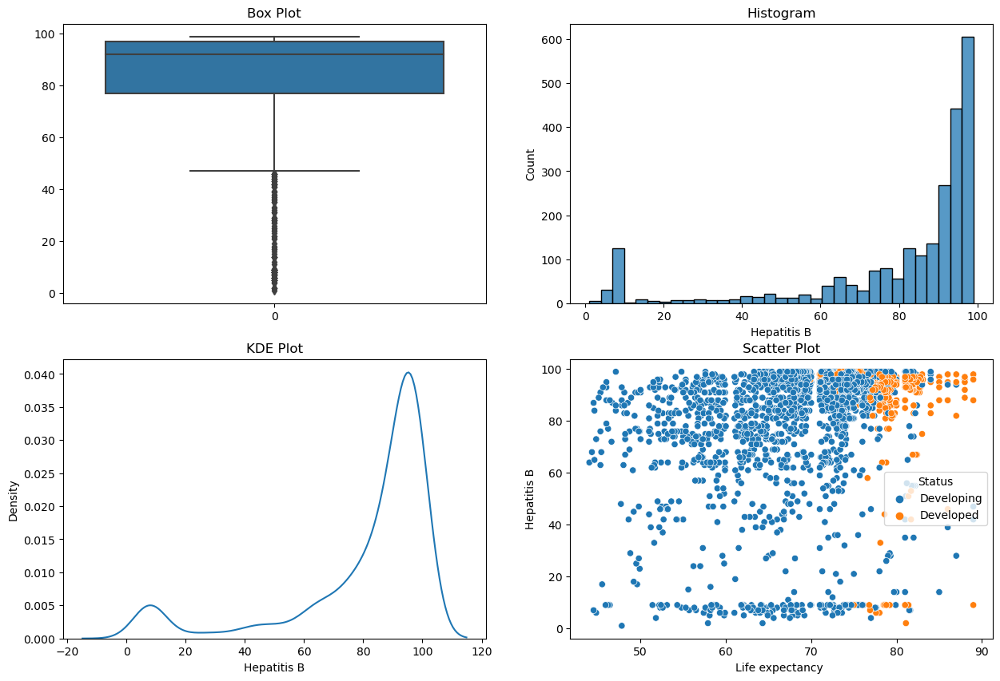

In [58]:
graph(df, "Hepatitis B")

### Measles (numerical)

In [59]:
df["Measles "].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Measles 
Non-Null Count  Dtype
--------------  -----
2938 non-null   int64
dtypes: int64(1)
memory usage: 23.1 KB


In [60]:
df["Measles "].describe()

count      2938.000000
mean       2419.592240
std       11467.272489
min           0.000000
25%           0.000000
50%          17.000000
75%         360.250000
max      212183.000000
Name: Measles , dtype: float64

In [61]:
df["Measles "].isnull().sum()

0

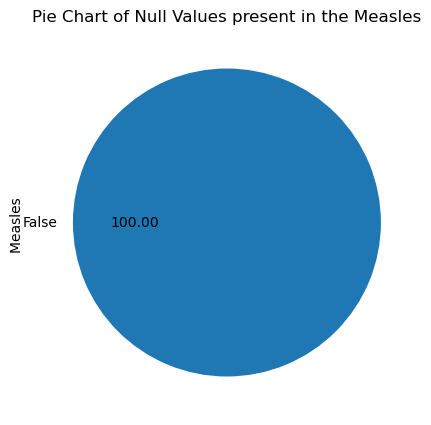

In [62]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Measles")
df["Measles "].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Measles ")
plt.show()

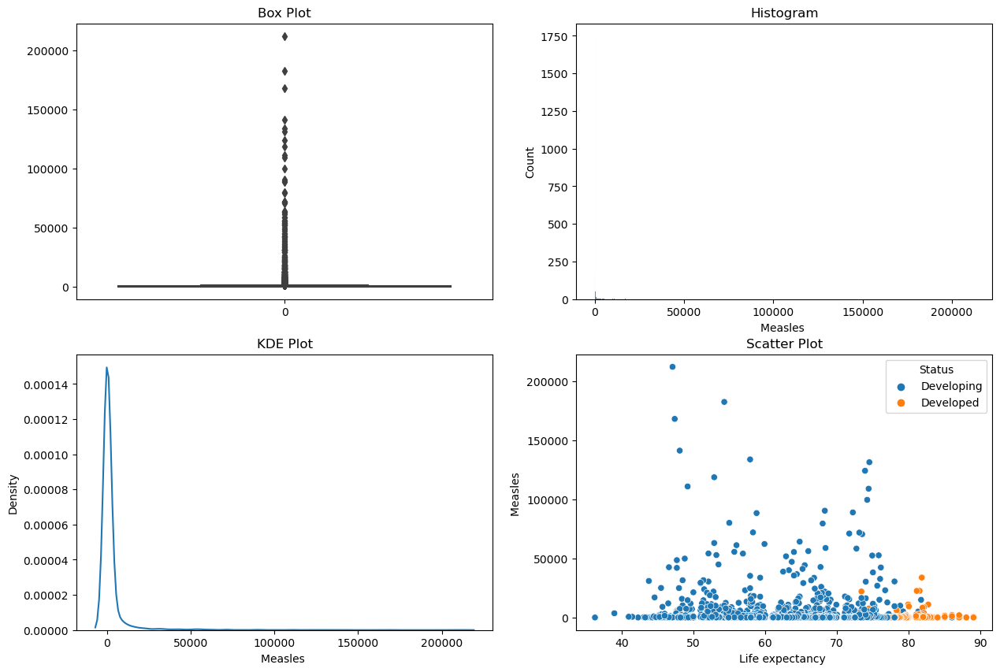

In [63]:
graph(df, "Measles ")

### BMI (numerical)

In [64]:
df[" BMI "].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name:  BMI 
Non-Null Count  Dtype  
--------------  -----  
2904 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [65]:
df[" BMI "].describe()

count    2904.000000
mean       38.321247
std        20.044034
min         1.000000
25%        19.300000
50%        43.500000
75%        56.200000
max        87.300000
Name:  BMI , dtype: float64

In [66]:
df[" BMI "].isnull().sum()

34

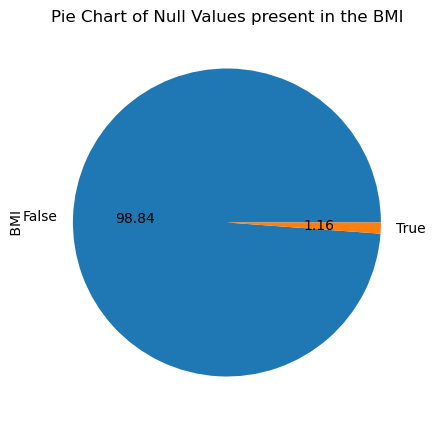

In [67]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the BMI")
df[" BMI "].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x=" BMI ")
plt.show()

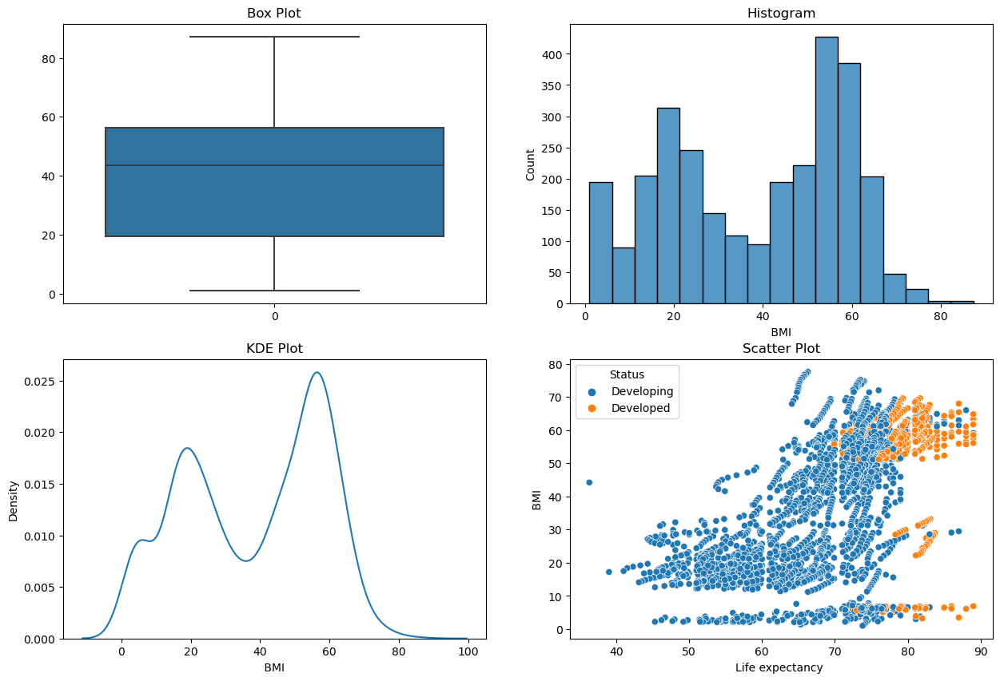

In [68]:
graph(df, " BMI ")

### Under-five deaths (numerical)

In [69]:
df["under-five deaths "].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: under-five deaths 
Non-Null Count  Dtype
--------------  -----
2938 non-null   int64
dtypes: int64(1)
memory usage: 23.1 KB


In [70]:
df["under-five deaths "].describe()

count    2938.000000
mean       42.035739
std       160.445548
min         0.000000
25%         0.000000
50%         4.000000
75%        28.000000
max      2500.000000
Name: under-five deaths , dtype: float64

In [71]:
df["under-five deaths "].isnull().sum()

0

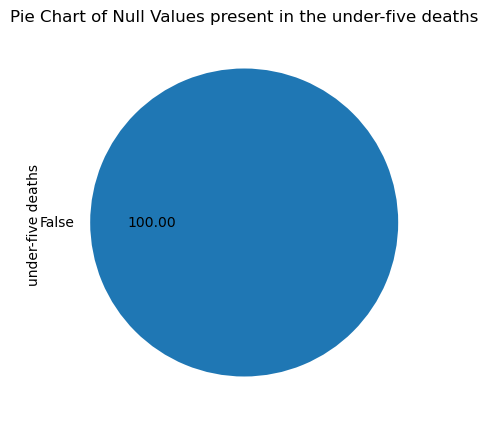

In [72]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the under-five deaths")
df["under-five deaths "].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="under-five deaths ")
plt.show()

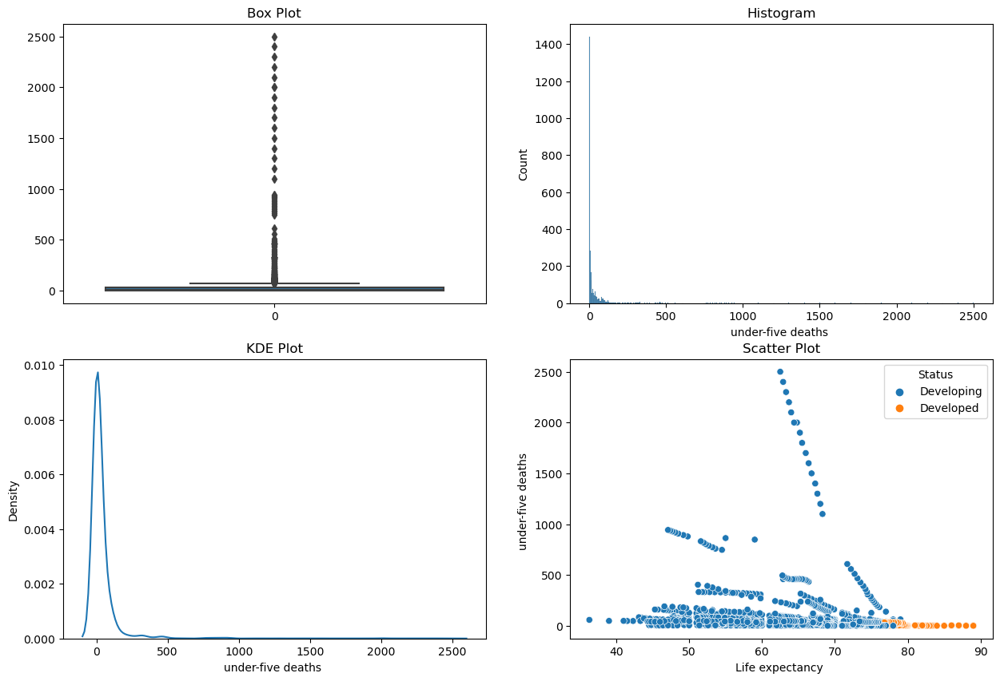

In [73]:
graph(df, "under-five deaths ")

### Polio (numerical)

In [74]:
df["Polio"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Polio
Non-Null Count  Dtype  
--------------  -----  
2919 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [75]:
df["Polio"].describe()

count    2919.000000
mean       82.550188
std        23.428046
min         3.000000
25%        78.000000
50%        93.000000
75%        97.000000
max        99.000000
Name: Polio, dtype: float64

In [76]:
df["Polio"].isnull().sum()

19

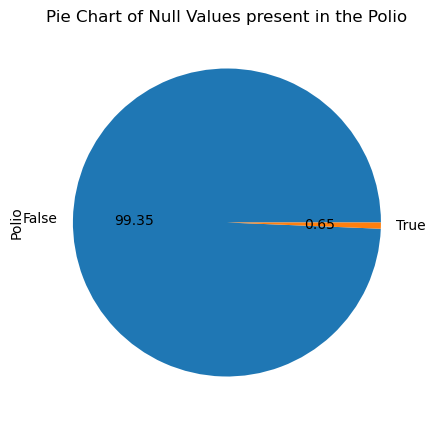

In [77]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Polio")
df["Polio"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Polio")
plt.show()

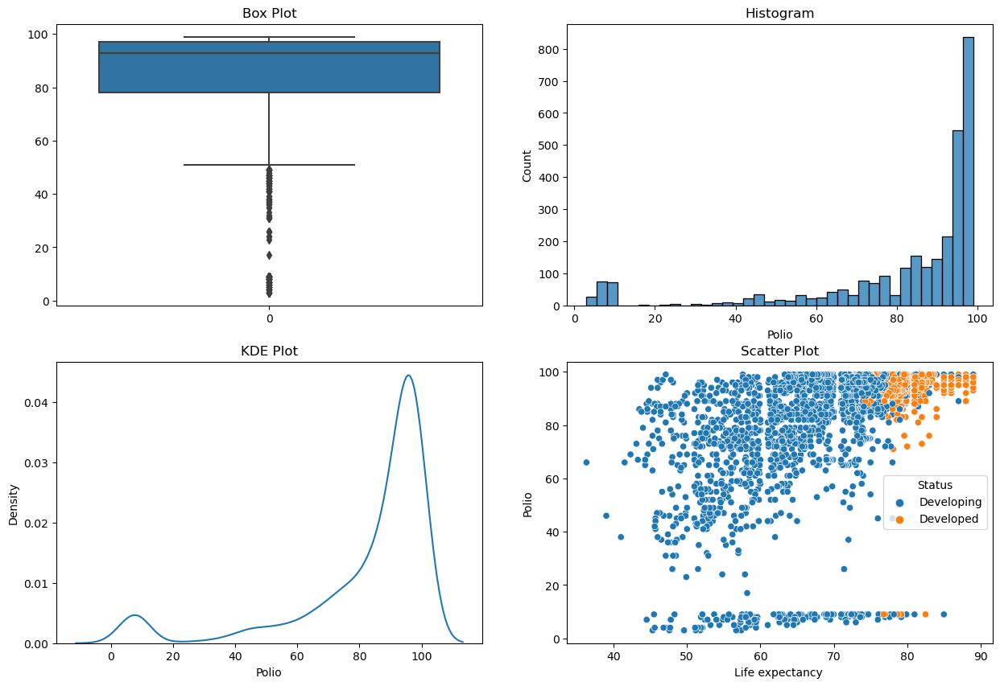

In [78]:
graph(df, "Polio")

### Total expenditure (numerical)

In [79]:
df["Total expenditure"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Total expenditure
Non-Null Count  Dtype  
--------------  -----  
2712 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [80]:
df["Total expenditure"].describe()

count    2712.00000
mean        5.93819
std         2.49832
min         0.37000
25%         4.26000
50%         5.75500
75%         7.49250
max        17.60000
Name: Total expenditure, dtype: float64

In [81]:
df["Total expenditure"].isnull().sum()

226

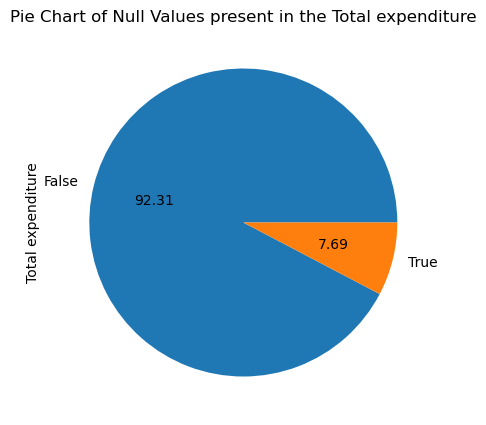

In [82]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Total expenditure")
df["Total expenditure"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Total expenditure")
plt.show()

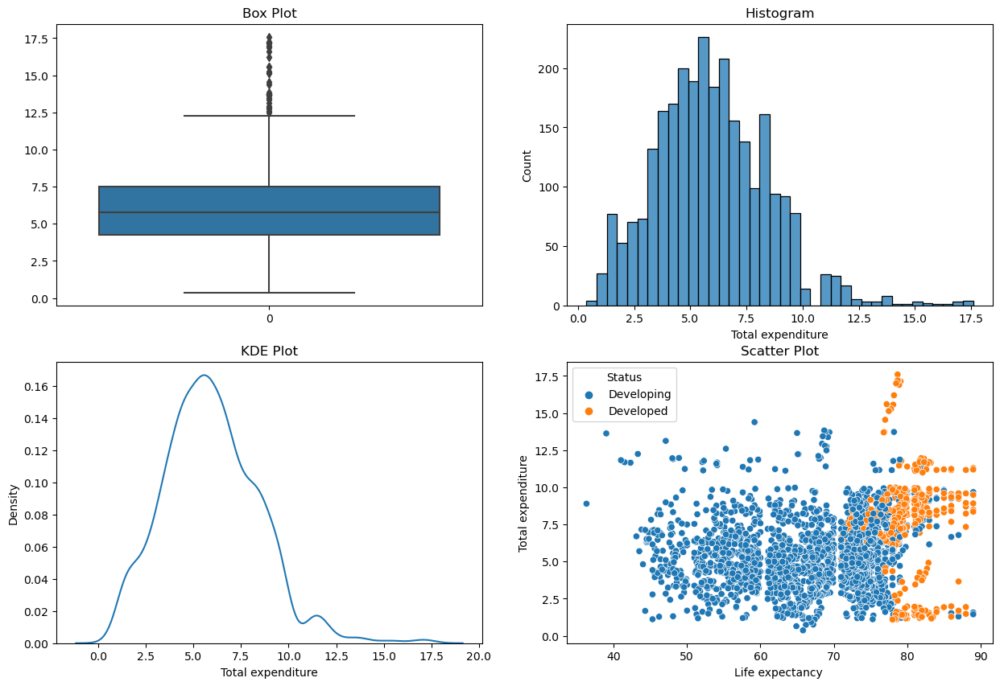

In [83]:
graph(df, "Total expenditure")

### Diphtheria (numerical)

In [84]:
df["Diphtheria "].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Diphtheria 
Non-Null Count  Dtype  
--------------  -----  
2919 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [85]:
df["Diphtheria "].describe()

count    2919.000000
mean       82.324084
std        23.716912
min         2.000000
25%        78.000000
50%        93.000000
75%        97.000000
max        99.000000
Name: Diphtheria , dtype: float64

In [86]:
df["Diphtheria "].isnull().sum()

19

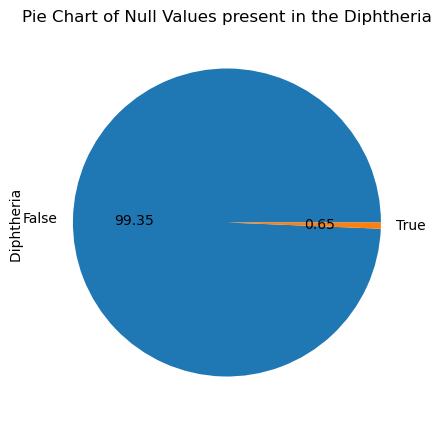

In [87]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Diphtheria")
df["Diphtheria "].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Diphtheria ")
plt.show()

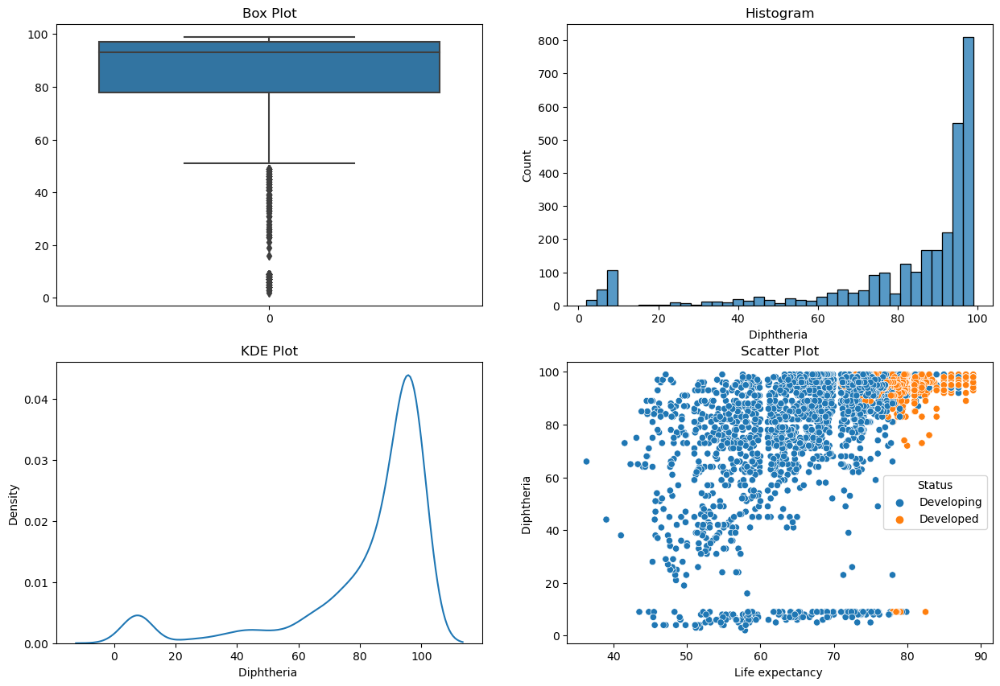

In [88]:
graph(df, "Diphtheria ")

### HIV/AIDS (numerical)

In [89]:
df[" HIV/AIDS"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name:  HIV/AIDS
Non-Null Count  Dtype  
--------------  -----  
2938 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [90]:
df[" HIV/AIDS"].describe()

count    2938.000000
mean        1.742103
std         5.077785
min         0.100000
25%         0.100000
50%         0.100000
75%         0.800000
max        50.600000
Name:  HIV/AIDS, dtype: float64

In [91]:
df[" HIV/AIDS"].isnull().sum()

0

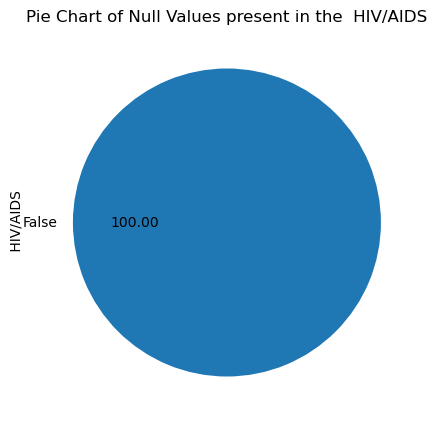

In [92]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the  HIV/AIDS")
df[" HIV/AIDS"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x=" HIV/AIDS")
plt.show()

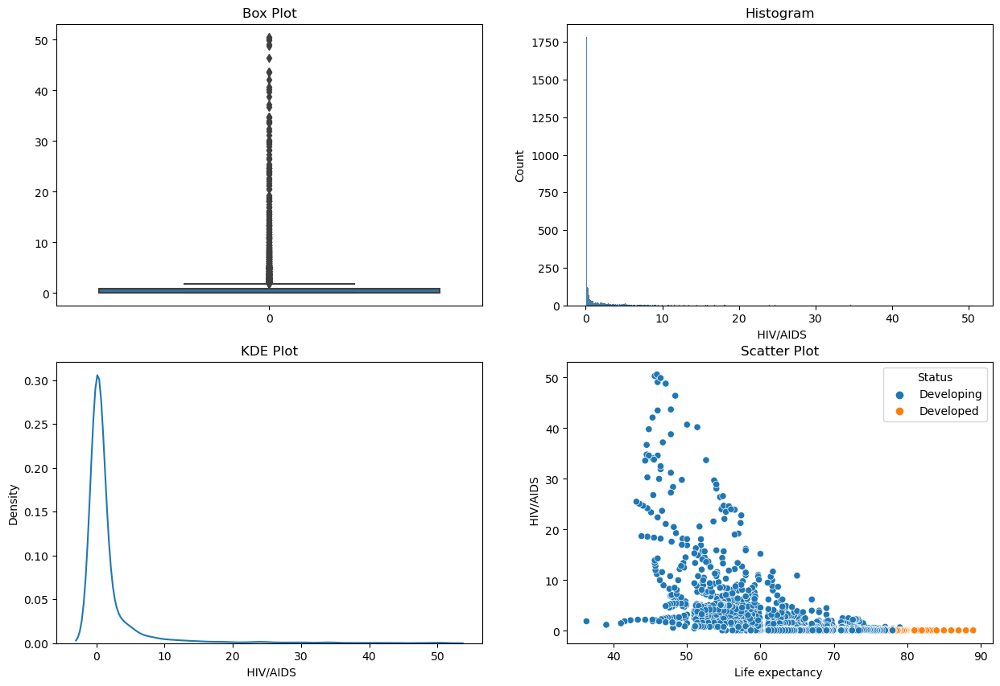

In [93]:
graph(df, " HIV/AIDS")

### GDP (numerical)

In [94]:
df["GDP"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: GDP
Non-Null Count  Dtype  
--------------  -----  
2490 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [95]:
df["GDP"].describe()

count      2490.000000
mean       7483.158469
std       14270.169342
min           1.681350
25%         463.935626
50%        1766.947595
75%        5910.806335
max      119172.741800
Name: GDP, dtype: float64

In [96]:
df["GDP"].isnull().sum()

448

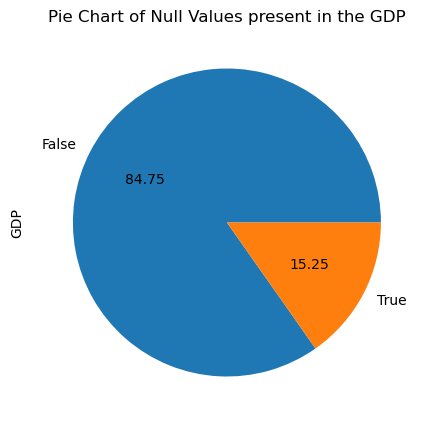

In [97]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the GDP")
df["GDP"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="GDP")
plt.show()

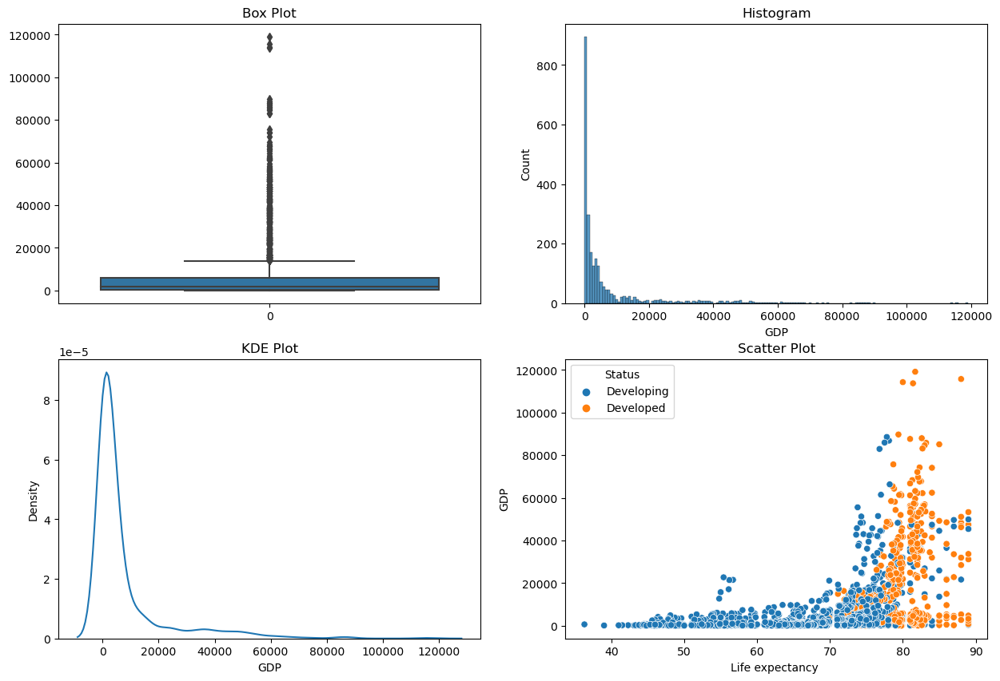

In [98]:
graph(df, "GDP")

### Population (numerical)

In [99]:
df["Population"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Population
Non-Null Count  Dtype  
--------------  -----  
2286 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [100]:
df["Population"].describe()

count    2.286000e+03
mean     1.275338e+07
std      6.101210e+07
min      3.400000e+01
25%      1.957932e+05
50%      1.386542e+06
75%      7.420359e+06
max      1.293859e+09
Name: Population, dtype: float64

In [101]:
df["Population"].isnull().sum()

652

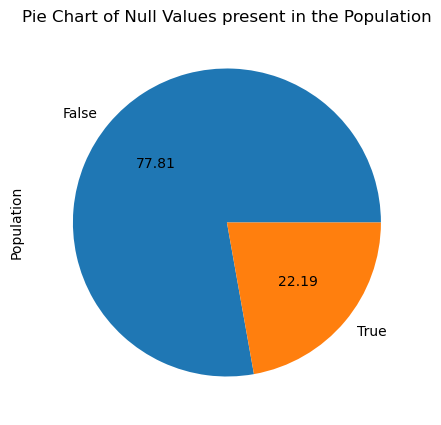

In [102]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Population")
df["Population"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Population")
plt.show()

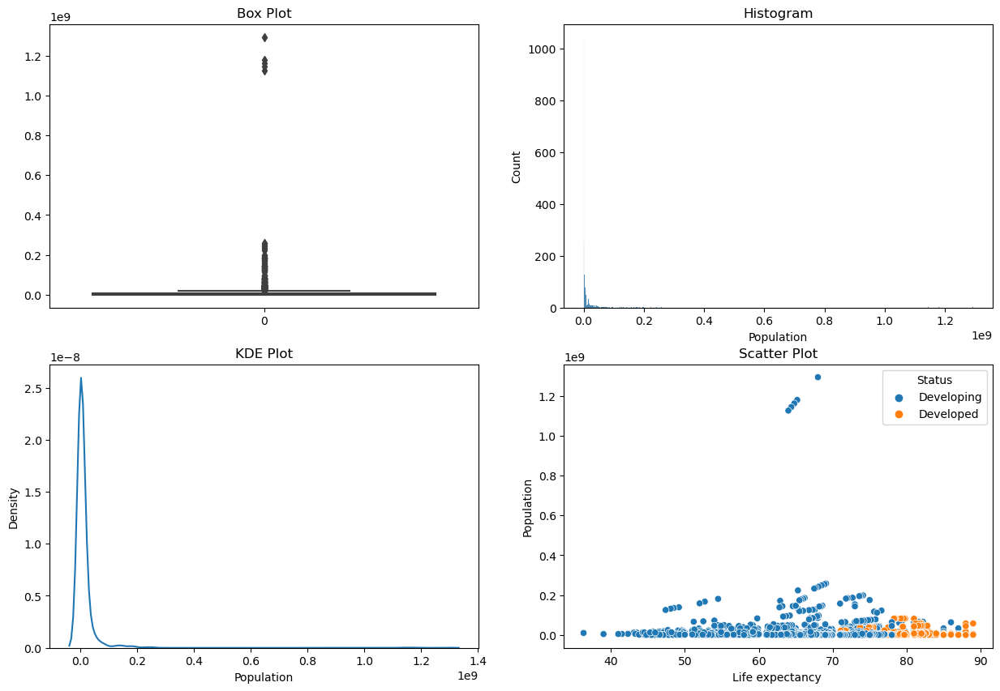

In [103]:
graph(df, "Population")

### Thinness  1-19 years (numerical)

In [104]:
df[" thinness  1-19 years"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name:  thinness  1-19 years
Non-Null Count  Dtype  
--------------  -----  
2904 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [105]:
df[" thinness  1-19 years"].describe()

count    2904.000000
mean        4.839704
std         4.420195
min         0.100000
25%         1.600000
50%         3.300000
75%         7.200000
max        27.700000
Name:  thinness  1-19 years, dtype: float64

In [106]:
df[" thinness  1-19 years"].isnull().sum()

34

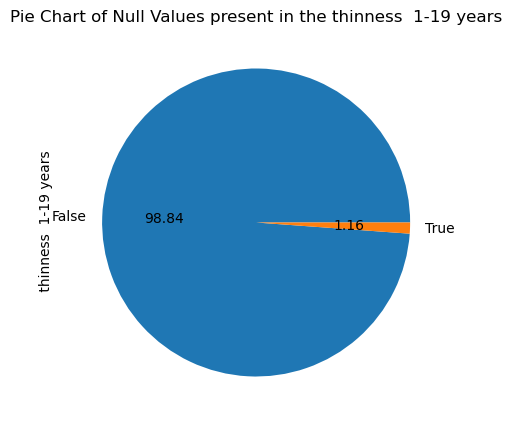

In [107]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the thinness  1-19 years")
df[" thinness  1-19 years"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x=" thinness  1-19 years")
plt.show()

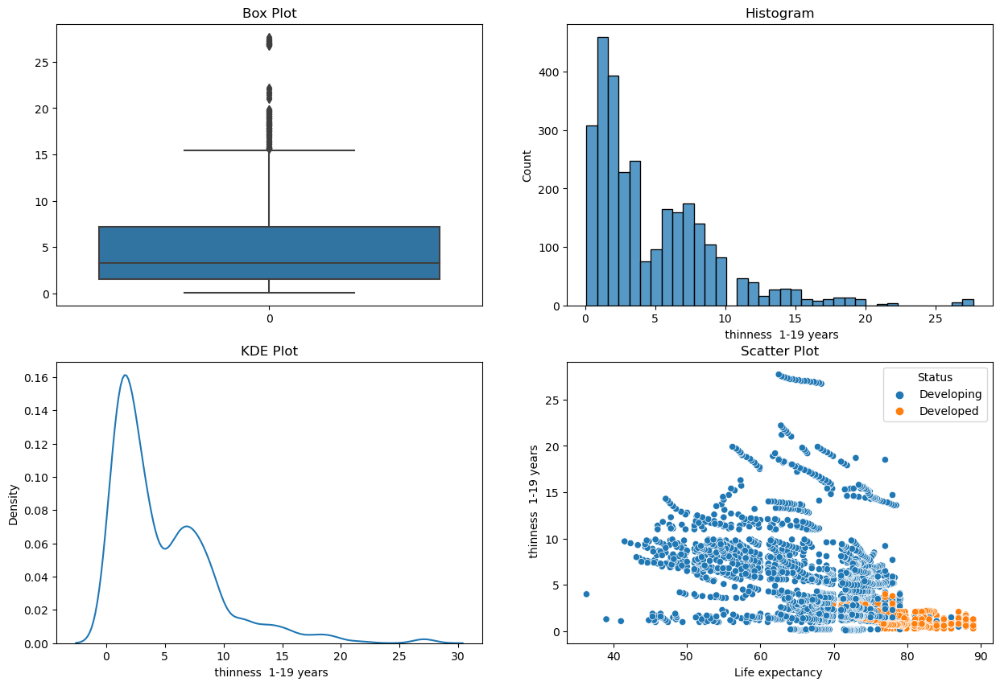

In [108]:
graph(df, " thinness  1-19 years")

### Thinness 5-9 years (numerical)

In [109]:
df[" thinness 5-9 years"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name:  thinness 5-9 years
Non-Null Count  Dtype  
--------------  -----  
2904 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [110]:
df[" thinness 5-9 years"].describe()

count    2904.000000
mean        4.870317
std         4.508882
min         0.100000
25%         1.500000
50%         3.300000
75%         7.200000
max        28.600000
Name:  thinness 5-9 years, dtype: float64

In [111]:
df[" thinness 5-9 years"].isnull().sum()

34

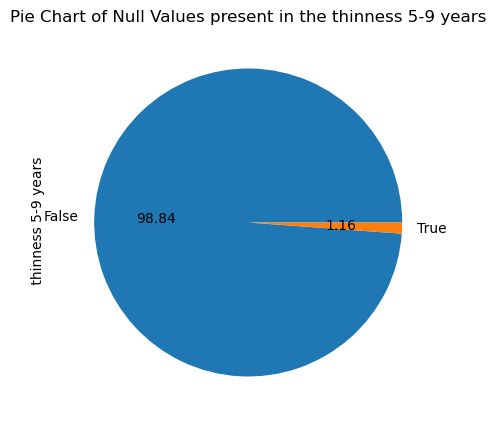

In [112]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the thinness 5-9 years")
df[" thinness 5-9 years"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x=" thinness 5-9 years")
plt.show()

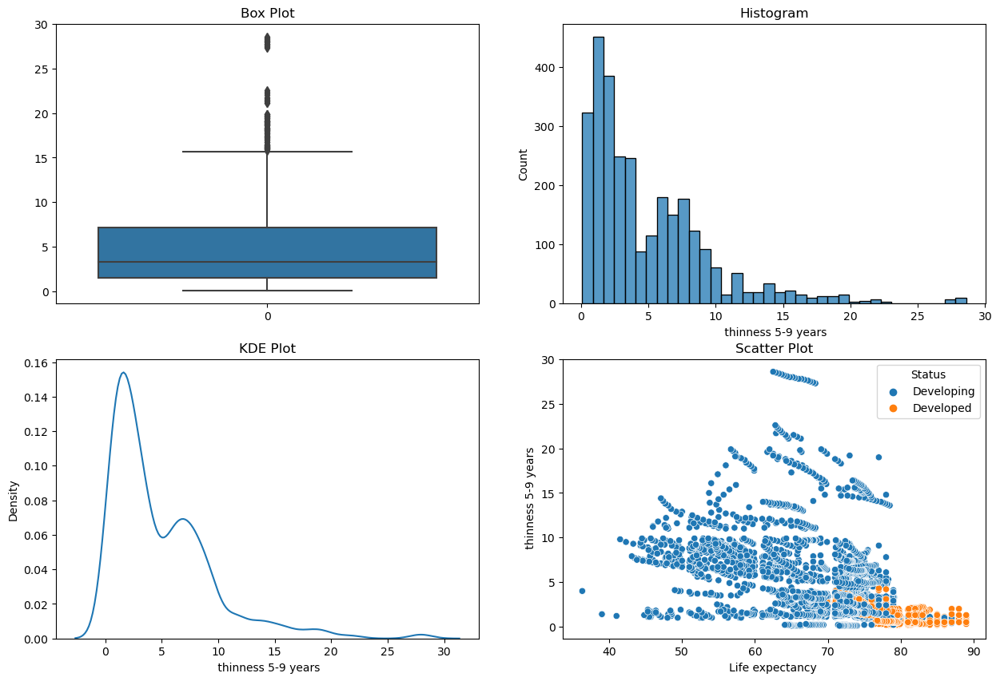

In [113]:
graph(df, " thinness 5-9 years")

### Income composition of resources (numerical)

In [114]:
df["Income composition of resources"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Income composition of resources
Non-Null Count  Dtype  
--------------  -----  
2771 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [115]:
df["Income composition of resources"].describe()

count    2771.000000
mean        0.627551
std         0.210904
min         0.000000
25%         0.493000
50%         0.677000
75%         0.779000
max         0.948000
Name: Income composition of resources, dtype: float64

In [116]:
df["Income composition of resources"].isnull().sum()

167

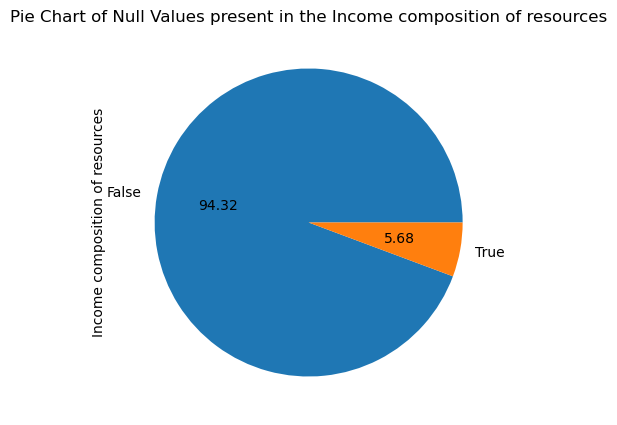

In [117]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Income composition of resources")
df["Income composition of resources"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Income composition of resources")
plt.show()

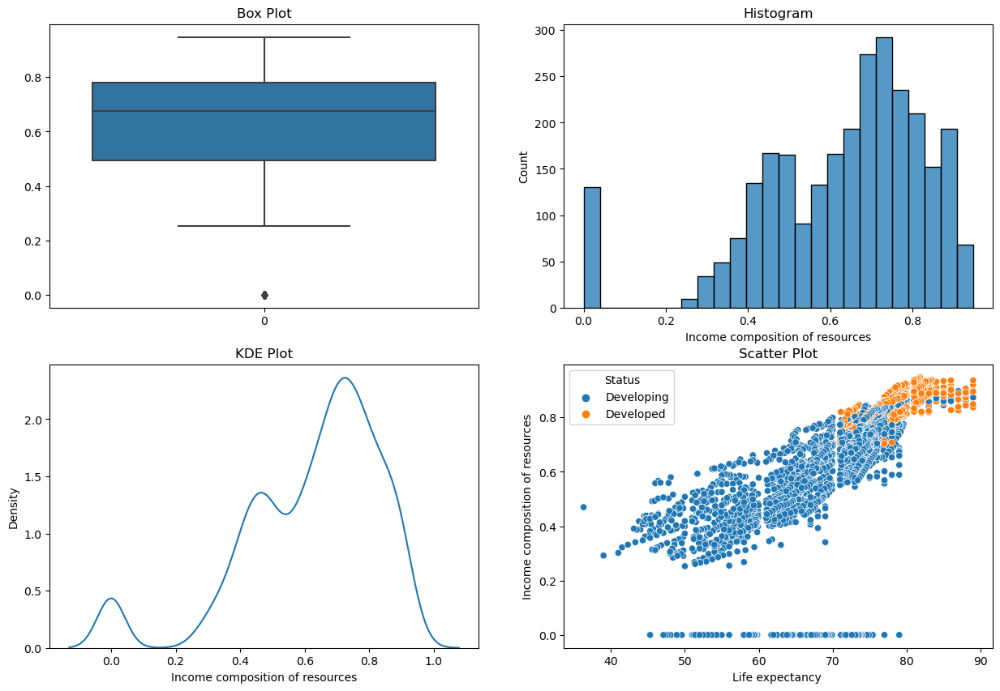

In [118]:
graph(df, "Income composition of resources")

### Schooling (numerical)

In [119]:
df["Schooling"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2938 entries, 0 to 2937
Series name: Schooling
Non-Null Count  Dtype  
--------------  -----  
2775 non-null   float64
dtypes: float64(1)
memory usage: 23.1 KB


In [120]:
df["Schooling"].describe()

count    2775.000000
mean       11.992793
std         3.358920
min         0.000000
25%        10.100000
50%        12.300000
75%        14.300000
max        20.700000
Name: Schooling, dtype: float64

In [121]:
df["Schooling"].isnull().sum()

163

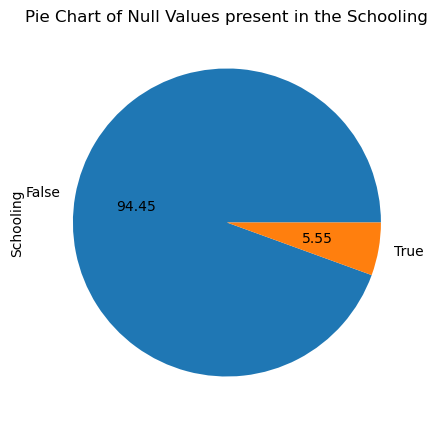

In [122]:
plt.figure(figsize=(7,5))
plt.title("Pie Chart of Null Values present in the Schooling")
df["Schooling"].isnull().value_counts().plot(kind="pie", autopct="%.2f")
# sns.countplot(data=df.isnull(), x="Schooling")
plt.show()

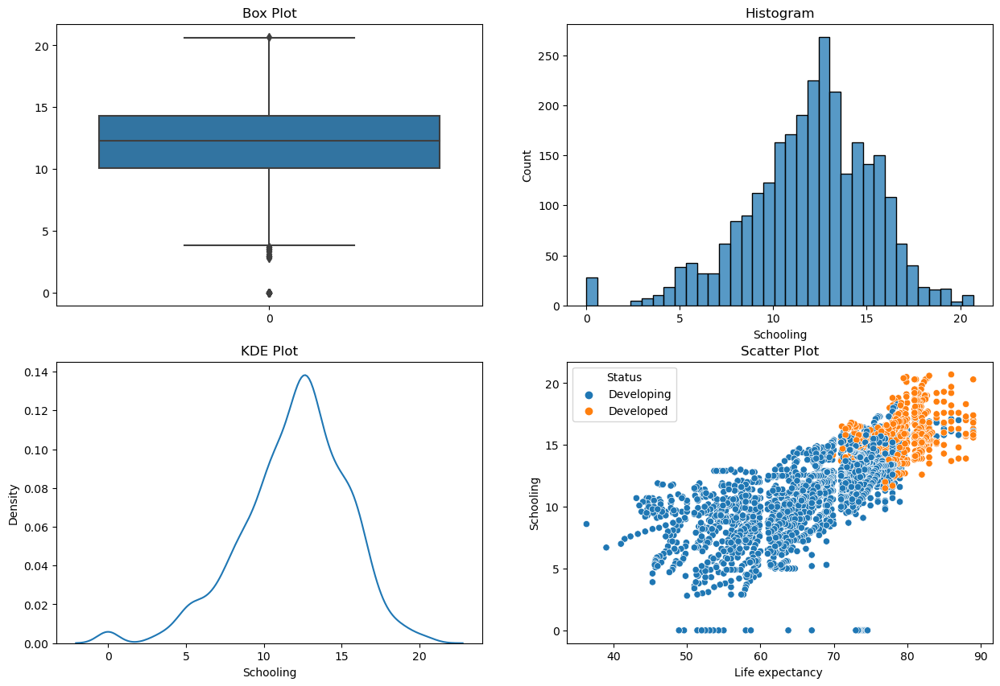

In [123]:
graph(df, "Schooling")

In [124]:
df_new = df.copy()

## Feature selection
<b>Selected Columns <b> <br>
  * Country <br>
  * Year <br>
  * Staus <br>
  * Life expectancy <br>
  * Adult Mortality <br>
  * infant deaths <br>
  * Alcohol <br>
  * Percentage expenditure <br>
  * Measles <br>
  * BMI <br>
  * under-five deaths <br>
  * Polio <br>
  * Diphtheria <br>
  * HIV/AIDS <br>
  * GDP <br>
  * Thinness  1-19 years <br>
  * Income composition of resources <br>
  * Schooling

In [125]:
df_new = df_new.drop(['Population', 'Hepatitis B', ' thinness 5-9 years', 'Total expenditure'], axis=1)

In [126]:
df_new.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Measles,BMI,under-five deaths,Polio,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,1154,19.1,83,6.0,65.0,0.1,584.259210,17.2,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,492,18.6,86,58.0,62.0,0.1,612.696514,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,430,18.1,89,62.0,64.0,0.1,631.744976,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,2787,17.6,93,67.0,67.0,0.1,669.959000,17.9,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,3013,17.2,97,68.0,68.0,0.1,63.537231,18.2,0.454,9.5


## Filling & removing the missing values

### Removing

In [127]:
col_drop = [i for i in df_new.columns if df_new[i].isnull().mean() < 0.05 and df_new[i].isnull().mean() > 0]
col_drop

['Life expectancy ',
 'Adult Mortality',
 ' BMI ',
 'Polio',
 'Diphtheria ',
 ' thinness  1-19 years']

In [128]:
len(df_new[col_drop].dropna()) / len(df_new)

0.9829816201497618

In [129]:
df_new_droped = df_new.dropna(subset=col_drop)

In [130]:
df_new_droped.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                      0
Adult Mortality                      0
infant deaths                        0
Alcohol                            175
percentage expenditure               0
Measles                              0
 BMI                                 0
under-five deaths                    0
Polio                                0
Diphtheria                           0
 HIV/AIDS                            0
GDP                                435
 thinness  1-19 years                0
Income composition of resources    160
Schooling                          160
dtype: int64

### Filling

In [131]:
median_Alcohol = df_new_droped["Alcohol"].median()
median_GDP = df_new_droped["GDP"].median()
mean_Income= df_new_droped["Income composition of resources"].mean()
mean_Schooling = df_new_droped["Schooling"].mean()

In [132]:
df_new_droped["median_Alcohol"] = df_new_droped["Alcohol"].fillna(median_Alcohol)
df_new_droped["median_GDP"] = df_new_droped["GDP"].fillna(median_GDP)
df_new_droped["mean_Income"] = df_new_droped["Income composition of resources"].fillna(mean_Income)
df_new_droped["mean_Schooling"] = df_new_droped["Schooling"].fillna(mean_Schooling)

C:\Users\bipla\AppData\Local\Temp\ipykernel_9192\3208763924.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_droped["median_Alcohol"] = df_new_droped["Alcohol"].fillna(median_Alcohol)
C:\Users\bipla\AppData\Local\Temp\ipykernel_9192\3208763924.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_droped["median_GDP"] = df_new_droped["GDP"].fillna(median_GDP)
C:\Users\bipla\AppData\Local\Temp\ipykernel_9192\3208763924.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

In [133]:
df_new_droped.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Measles,BMI,...,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,Income composition of resources,Schooling,median_Alcohol,median_GDP,mean_Income,mean_Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,1154,19.1,...,65.0,0.1,584.259210,17.2,0.479,10.1,0.01,584.259210,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,492,18.6,...,62.0,0.1,612.696514,17.5,0.476,10.0,0.01,612.696514,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,430,18.1,...,64.0,0.1,631.744976,17.7,0.470,9.9,0.01,631.744976,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,2787,17.6,...,67.0,0.1,669.959000,17.9,0.463,9.8,0.01,669.959000,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,3013,17.2,...,68.0,0.1,63.537231,18.2,0.454,9.5,0.01,63.537231,0.454,9.5


In [134]:
df_new_droped["Alcohol"].var(), df_new_droped["median_Alcohol"].var()

(16.431093845621554, 15.474688703251806)

In [135]:
df_new_droped["GDP"].var(), df_new_droped["median_GDP"].var()

(206105351.6132651, 179303113.42803004)

In [136]:
df_new_droped["Income composition of resources"].var(), df_new_droped["mean_Income"].var()

(0.04252259958468958, 0.040165960882386026)

In [137]:
df_new_droped["Schooling"].var(), df_new_droped["mean_Schooling"].var()

(10.222084379136794, 9.65556775265191)

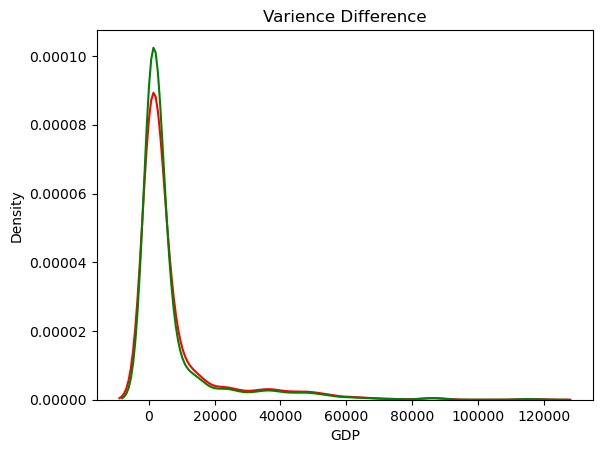

In [138]:
fig=plt.figure()
ax=fig.add_subplot(111)
plt.title("Varience Difference")
sns.kdeplot(data=df_new["GDP"], ax=ax, color="red")
sns.kdeplot(data=df_new_droped["median_GDP"], ax=ax, color="green")
plt.show()

In [139]:
final_df = df_new_droped.drop(['Alcohol', 'GDP', 'Income composition of resources', 'Schooling'], axis=1)

In [140]:
final_df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,percentage expenditure,Measles,BMI,under-five deaths,Polio,Diphtheria,HIV/AIDS,thinness 1-19 years,median_Alcohol,median_GDP,mean_Income,mean_Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,71.279624,1154,19.1,83,6.0,65.0,0.1,17.2,0.01,584.259210,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,73.523582,492,18.6,86,58.0,62.0,0.1,17.5,0.01,612.696514,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,73.219243,430,18.1,89,62.0,64.0,0.1,17.7,0.01,631.744976,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,78.184215,2787,17.6,93,67.0,67.0,0.1,17.9,0.01,669.959000,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,7.097109,3013,17.2,97,68.0,68.0,0.1,18.2,0.01,63.537231,0.454,9.5


## Handling Outliers (With IQR Method by capping)

In [141]:
df_without_otliers = final_df.copy()

#########################################################################

Variable Name :  Life expectancy 
Persentile 25 :  63.475
Persentile 75 :  75.8
IQR :  12.324999999999996
Upper Limit :  94.2875
Lower Limit :  44.98750000000001
Outliers Removed using IQR Method by Capping


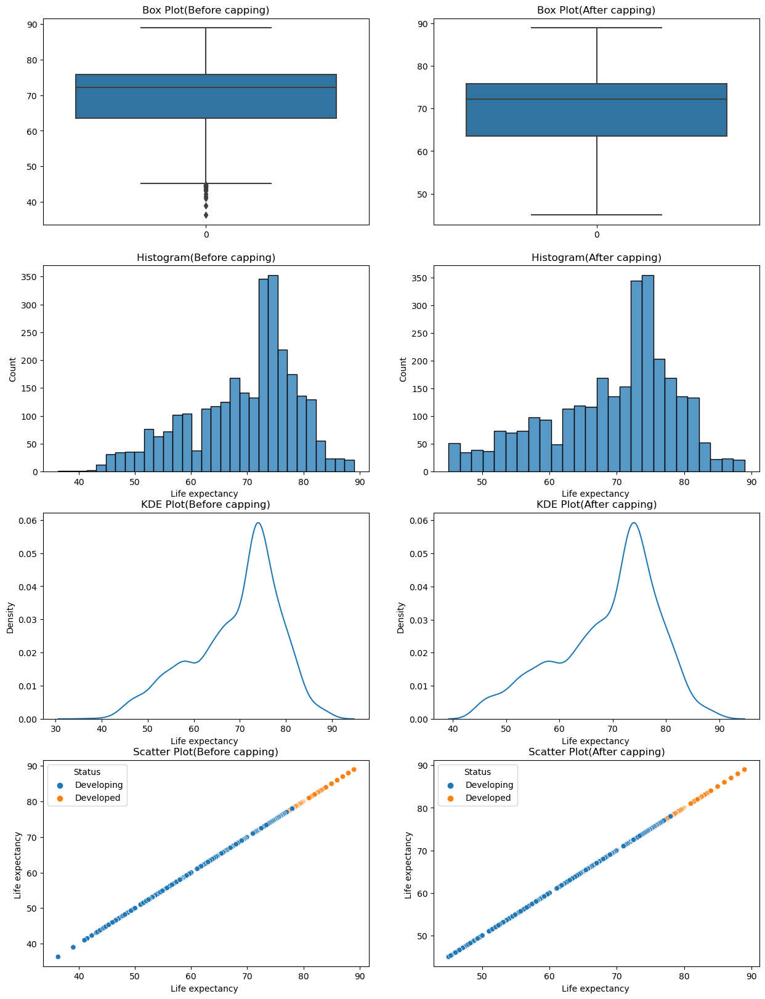

#########################################################################

Variable Name :  Adult Mortality
Persentile 25 :  73.0
Persentile 75 :  225.0
IQR :  152.0
Upper Limit :  453.0
Lower Limit :  -155.0
Outliers Removed using IQR Method by Capping


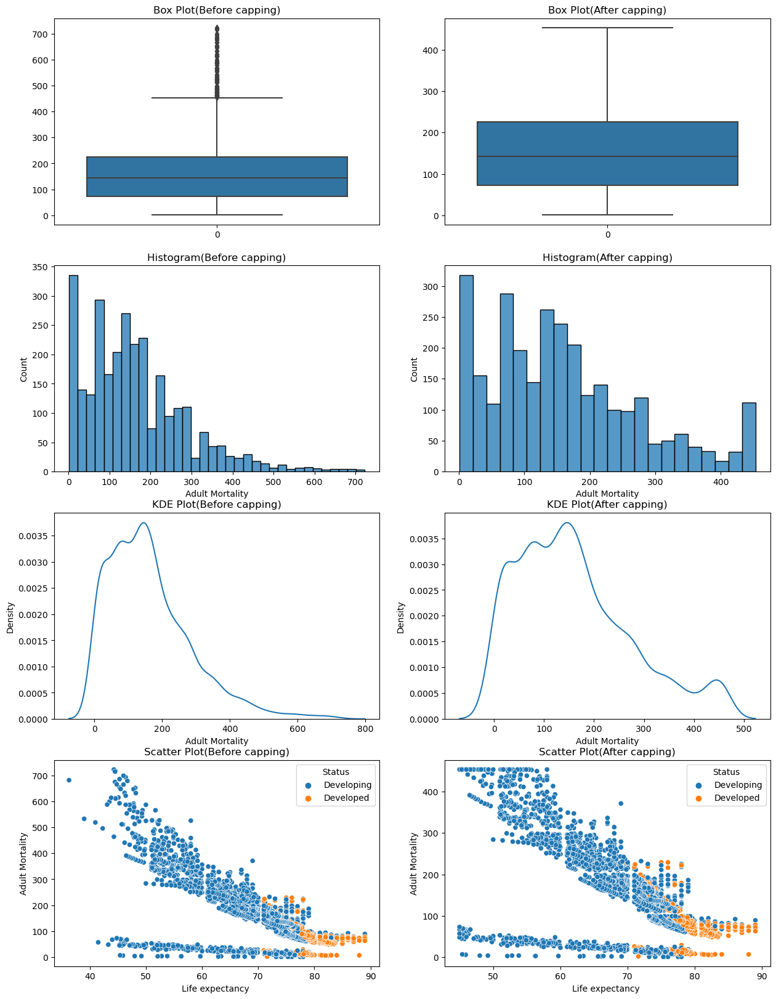

#########################################################################

Variable Name :  infant deaths
Persentile 25 :  0.0
Persentile 75 :  21.0
IQR :  21.0
Upper Limit :  52.5
Lower Limit :  -31.5
Outliers Removed using IQR Method by Capping


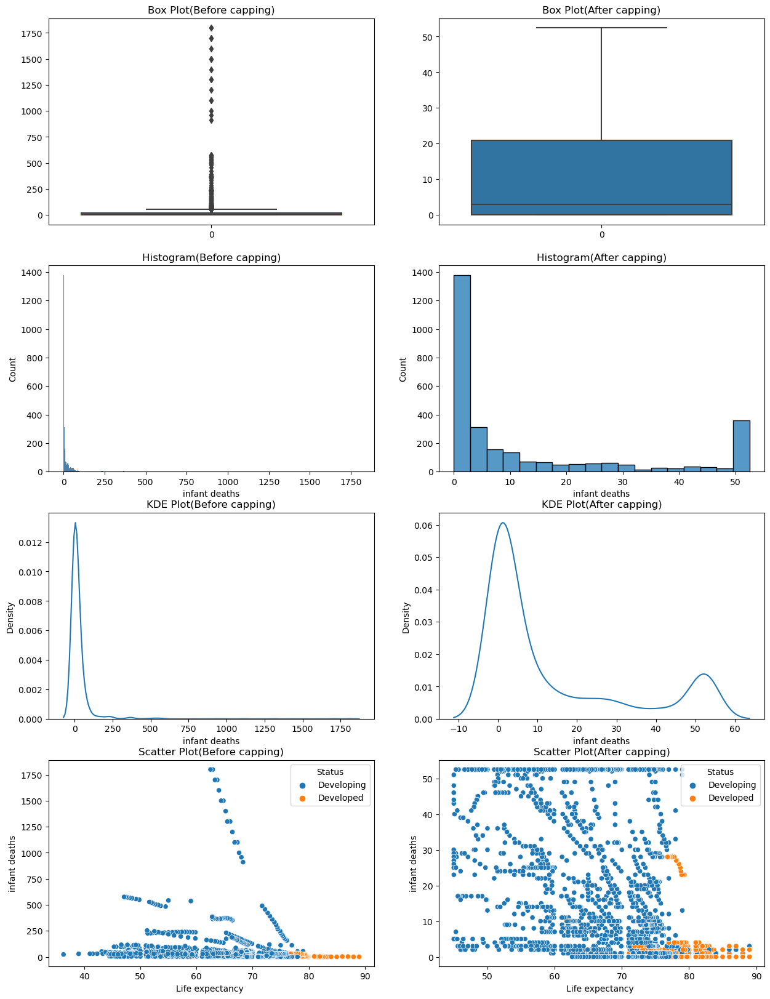

#########################################################################

Variable Name :  percentage expenditure
Persentile 25 :  5.049462446
Persentile 75 :  454.42242995000004
IQR :  449.37296750400003
Upper Limit :  1128.4818812060003
Lower Limit :  -669.0099888100001
Outliers Removed using IQR Method by Capping


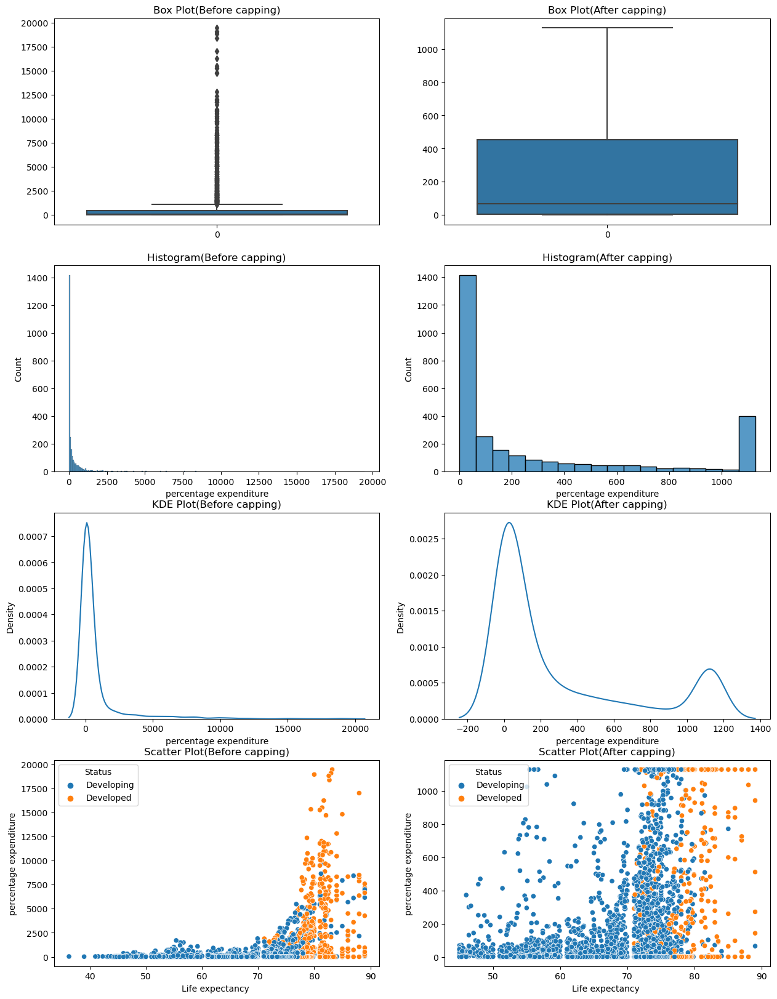

#########################################################################

Variable Name :  Measles 
Persentile 25 :  0.0
Persentile 75 :  352.25
IQR :  352.25
Upper Limit :  880.625
Lower Limit :  -528.375
Outliers Removed using IQR Method by Capping


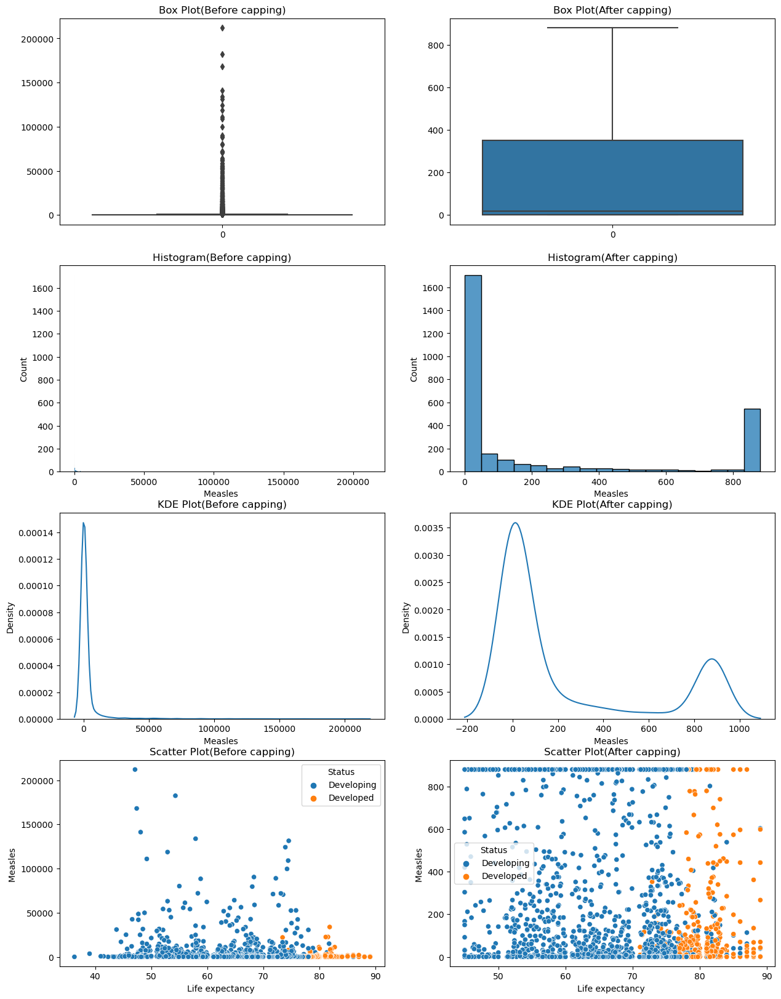

#########################################################################

Variable Name :   BMI 
No Outliers found
#########################################################################

Variable Name :  under-five deaths 
Persentile 25 :  0.0
Persentile 75 :  26.0
IQR :  26.0
Upper Limit :  65.0
Lower Limit :  -39.0
Outliers Removed using IQR Method by Capping


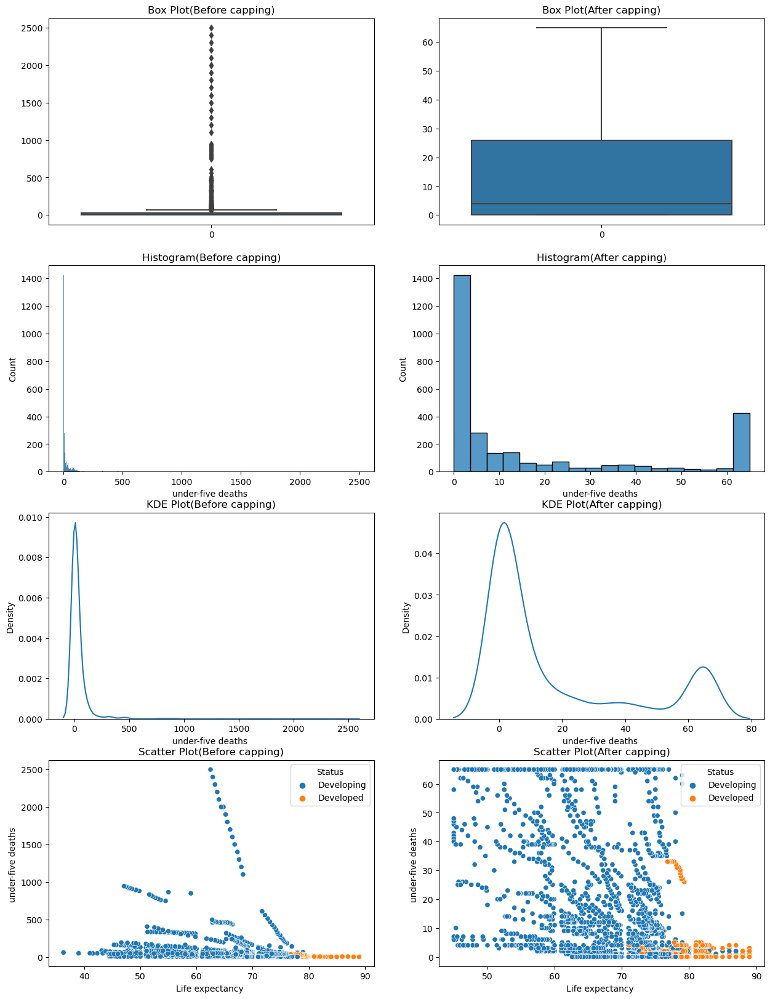

#########################################################################

Variable Name :  Polio
Persentile 25 :  78.0
Persentile 75 :  97.0
IQR :  19.0
Upper Limit :  125.5
Lower Limit :  49.5
Outliers Removed using IQR Method by Capping


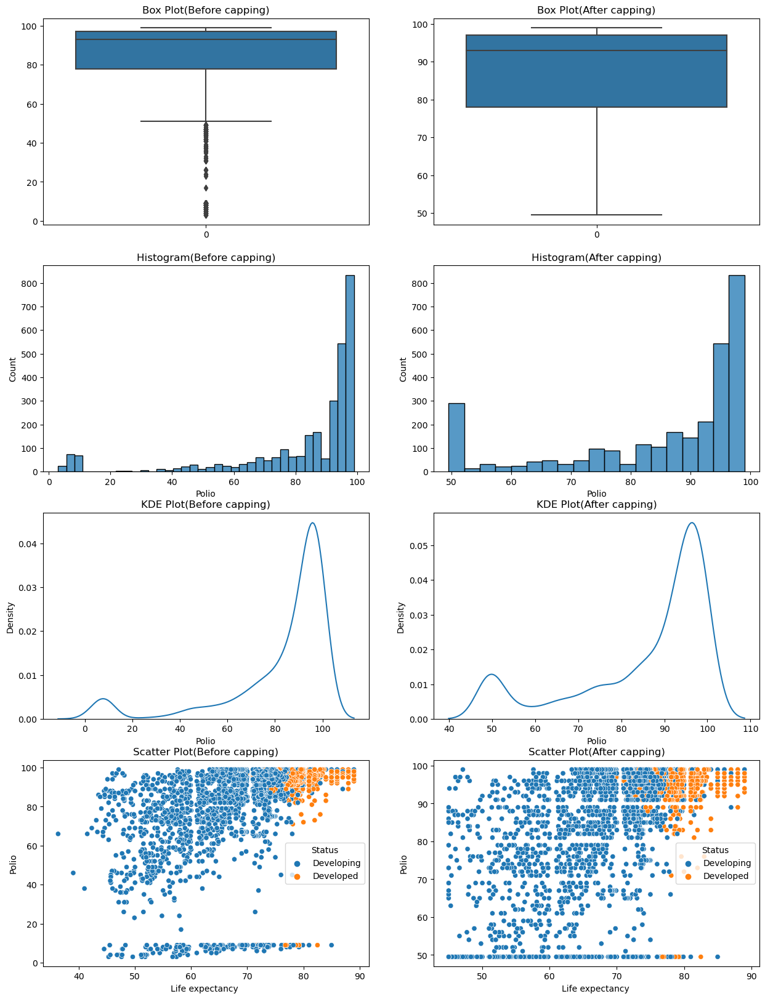

#########################################################################

Variable Name :  Diphtheria 
Persentile 25 :  78.0
Persentile 75 :  97.0
IQR :  19.0
Upper Limit :  125.5
Lower Limit :  49.5
Outliers Removed using IQR Method by Capping


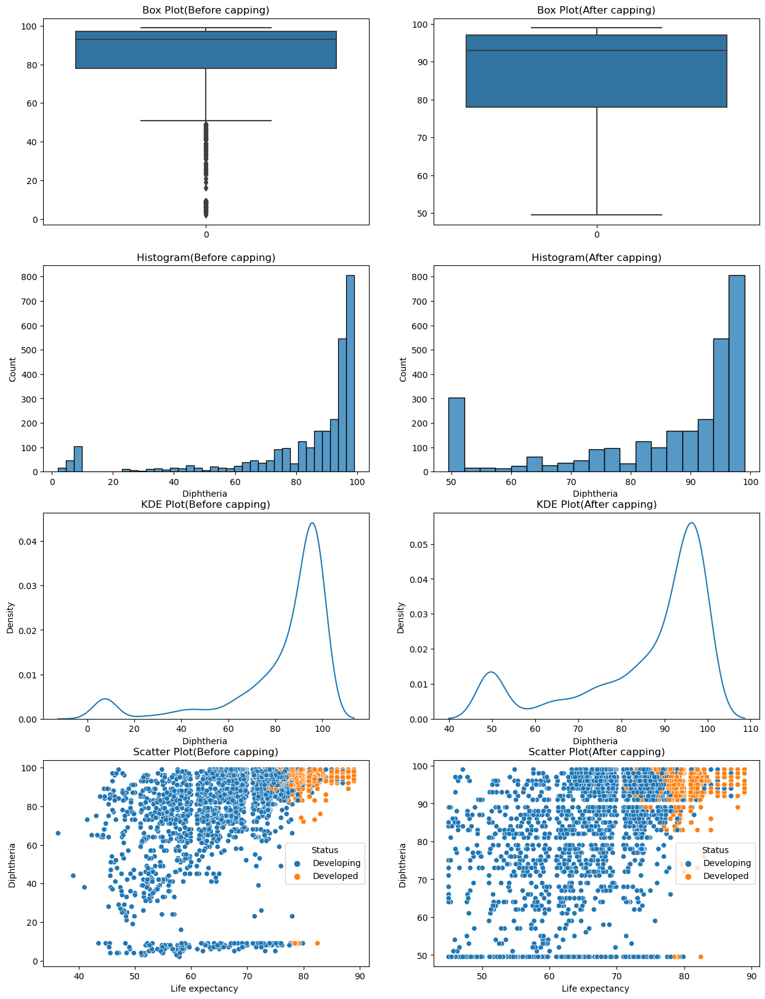

#########################################################################

Variable Name :   HIV/AIDS
Persentile 25 :  0.1
Persentile 75 :  0.8
IQR :  0.7000000000000001
Upper Limit :  1.85
Lower Limit :  -0.9500000000000001
Outliers Removed using IQR Method by Capping


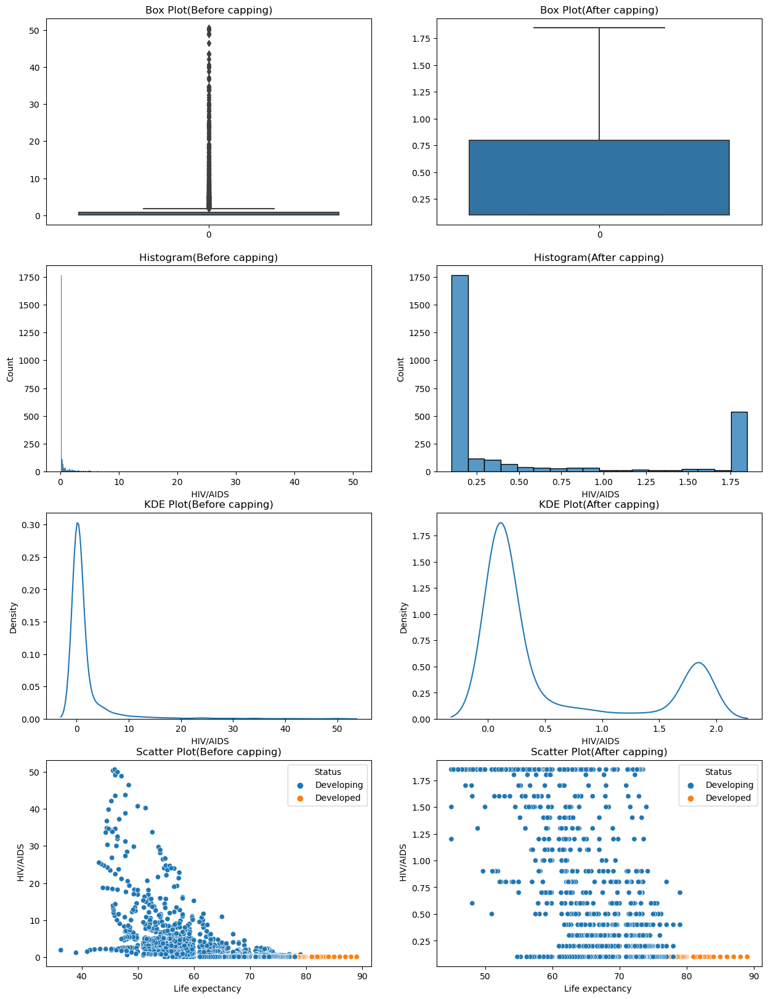

#########################################################################

Variable Name :   thinness  1-19 years
Persentile 25 :  1.6
Persentile 75 :  7.2
IQR :  5.6
Upper Limit :  15.599999999999998
Lower Limit :  -6.799999999999999
Outliers Removed using IQR Method by Capping


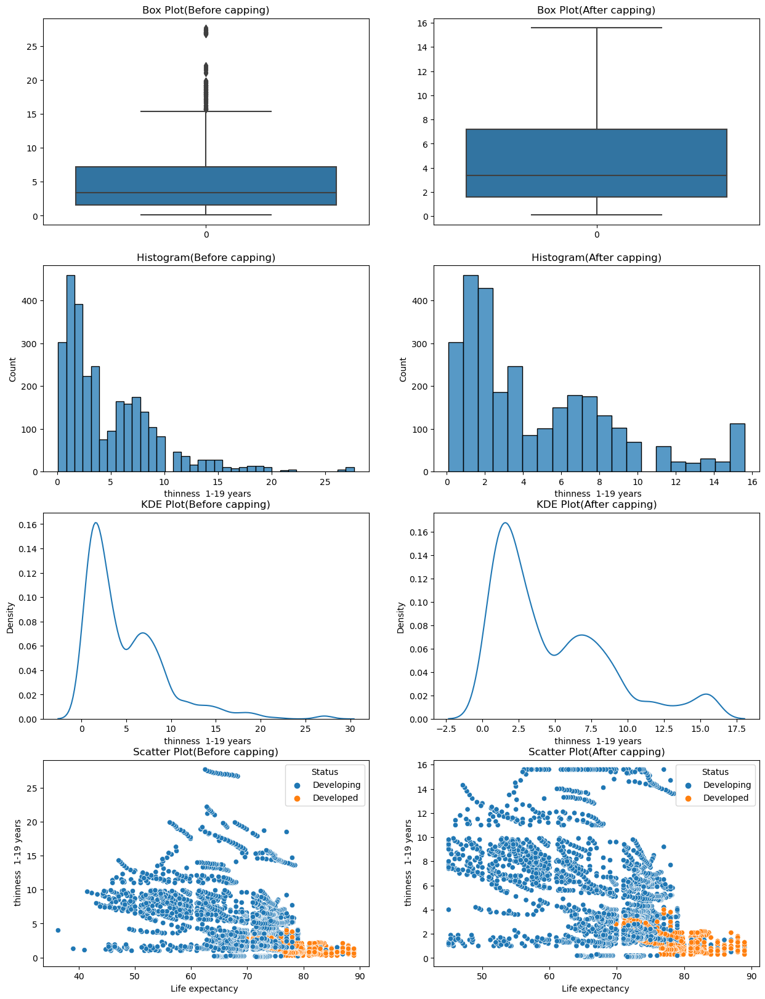

#########################################################################

Variable Name :  median_Alcohol
Persentile 25 :  1.1075000000000002
Persentile 75 :  7.49
IQR :  6.3825
Upper Limit :  17.06375
Lower Limit :  -8.46625
Outliers Removed using IQR Method by Capping


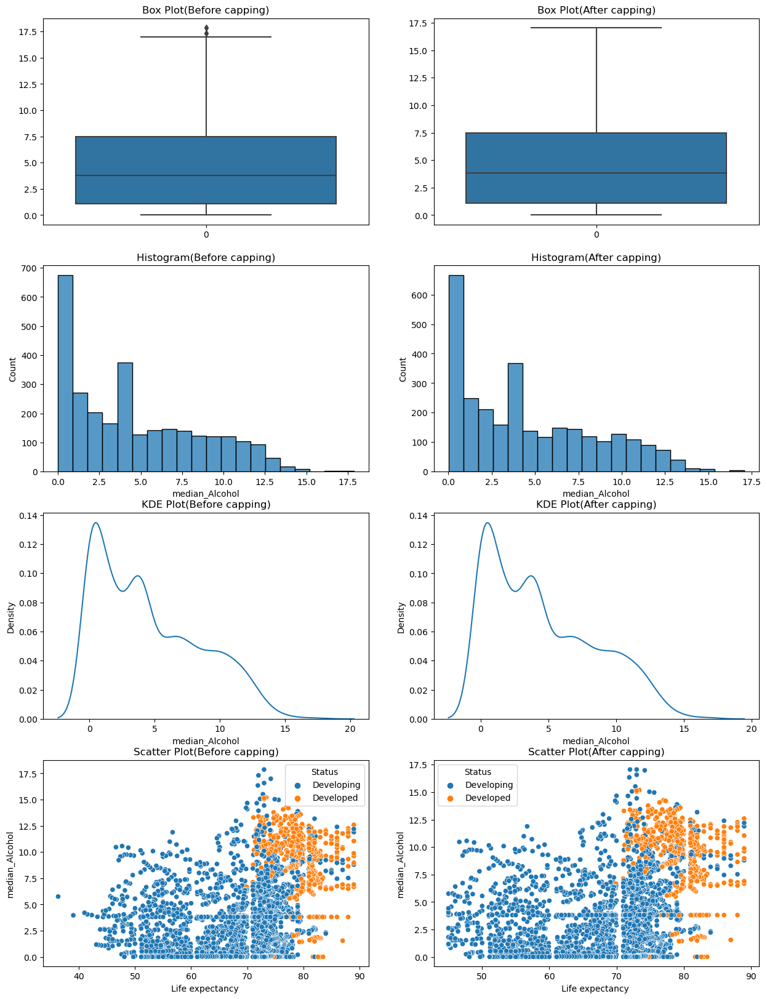

#########################################################################

Variable Name :  median_GDP
Persentile 25 :  579.651825
Persentile 75 :  4901.575091250001
IQR :  4321.923266250001
Upper Limit :  11384.459990625002
Lower Limit :  -5903.233074375002
Outliers Removed using IQR Method by Capping


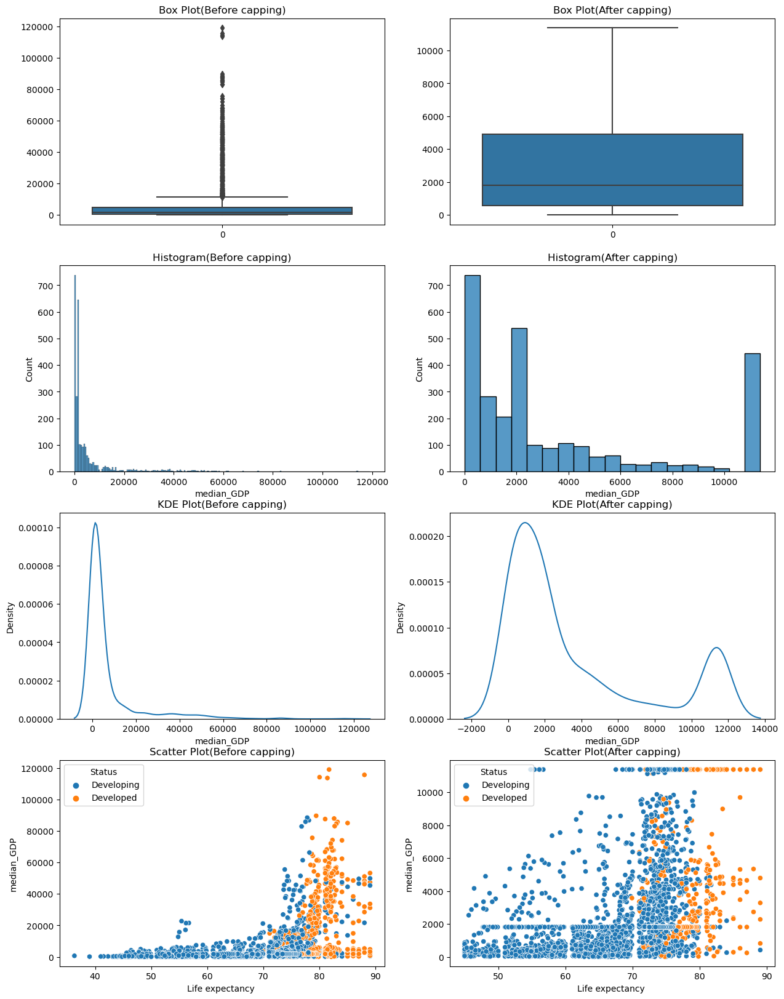

#########################################################################

Variable Name :  mean_Income
Persentile 25 :  0.51175
Persentile 75 :  0.774
IQR :  0.26225
Upper Limit :  1.167375
Lower Limit :  0.11837500000000006
Outliers Removed using IQR Method by Capping


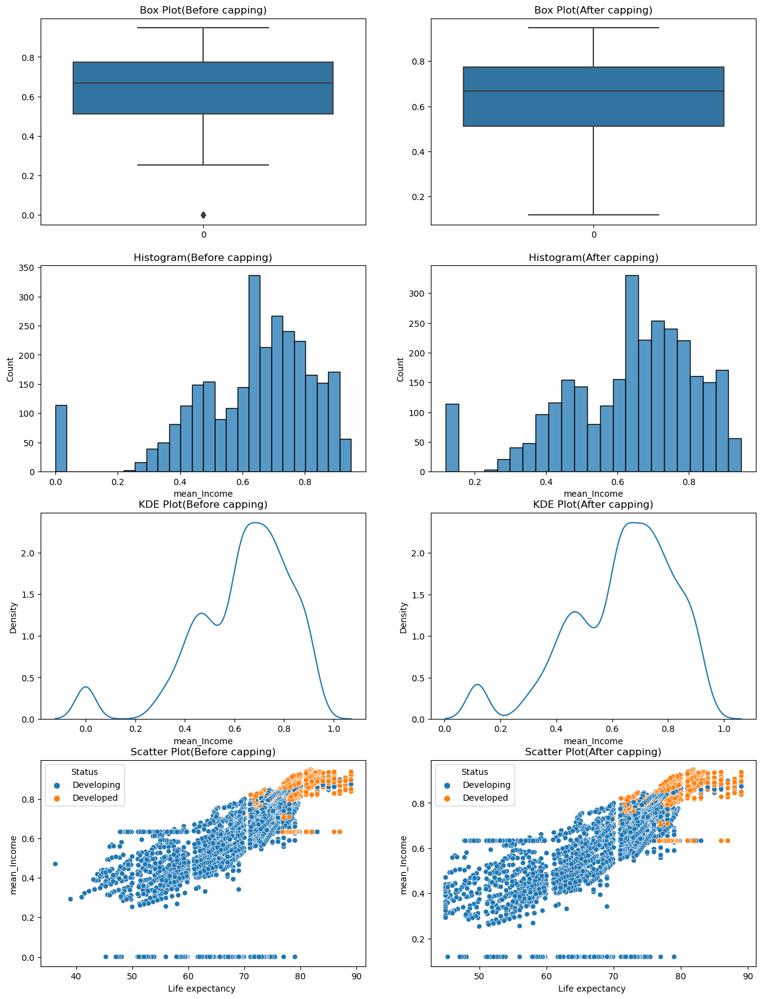

#########################################################################

Variable Name :  mean_Schooling
Persentile 25 :  10.4
Persentile 75 :  14.2
IQR :  3.799999999999999
Upper Limit :  19.9
Lower Limit :  4.700000000000002
Outliers Removed using IQR Method by Capping


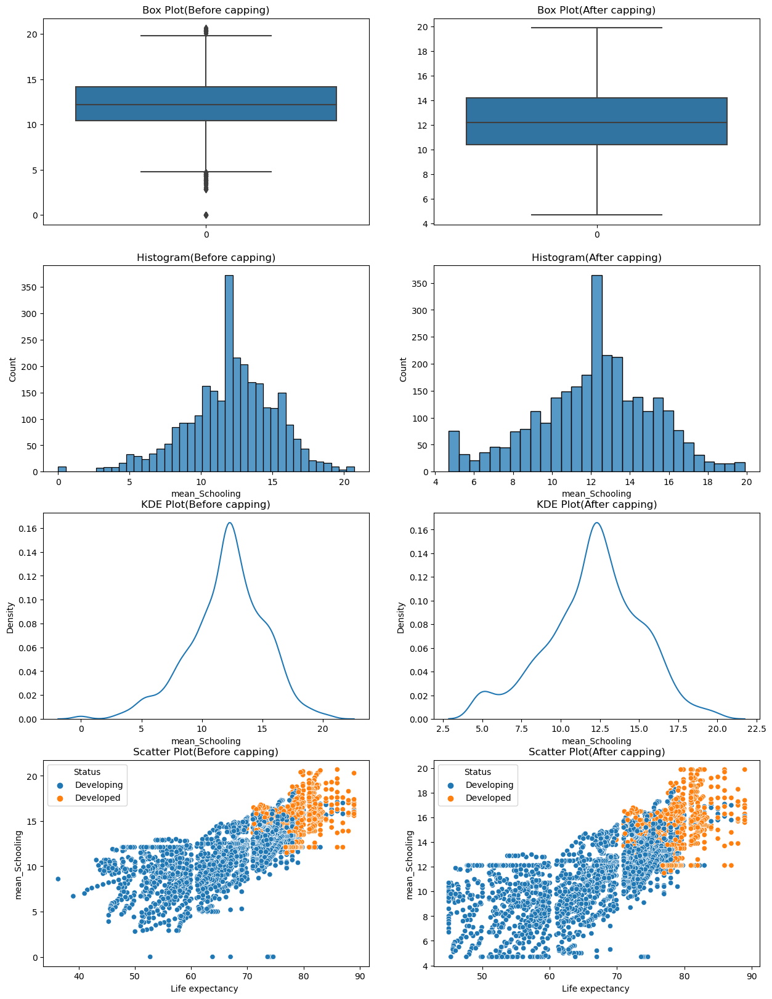

In [142]:
cap(final_df, df_without_otliers)

## Train Test Split

In [143]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(final_df.drop(columns=["Life expectancy "]), final_df["Life expectancy "], test_size=0.3, random_state=12)
X_train_without_outliers, X_test_without_outliers, y_train_without_outliers, y_test_without_outliers = train_test_split(df_without_otliers.drop(columns=["Life expectancy "]), df_without_otliers["Life expectancy "], test_size=0.3, random_state=12)

In [144]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2021, 17), (867, 17), (2021,), (867,))

In [145]:
X_train_without_outliers.shape, X_test_without_outliers.shape, y_train_without_outliers.shape, y_test_without_outliers.shape

((2021, 17), (867, 17), (2021,), (867,))

## Encoding

In [146]:
trnsformer = ColumnTransformer(transformers=[
    ('oe', OrdinalEncoder(categories=[["Developing", "Developed"]]), ["Status"]),
    ('ohe', OneHotEncoder(sparse=False, drop="first"), ["Country"])
], remainder="passthrough")

In [147]:
X_train = trnsformer.fit_transform(X_train)

In [148]:
X_test = trnsformer.transform(X_test)

In [149]:
X_train_without_outliers = trnsformer.fit_transform(X_train_without_outliers)

In [150]:
X_test_without_outliers = trnsformer.transform(X_test_without_outliers)

## Standardization

In [151]:
scaler1 = StandardScaler()
X_train_stand=scaler1.fit_transform(X_train)
X_test_stand=scaler1.transform(X_test)

In [152]:
X_train_stand.shape, X_test_stand.shape

((2021, 196), (867, 196))

In [153]:
X_train_stand

array([[-0.46476318, -0.07397727, -0.08933112, ..., -0.37809873,
         0.2651249 ,  0.53723124],
       [-0.46476318, -0.07397727, -0.08933112, ..., -0.0947713 ,
         0.06916371, -0.00773417],
       [-0.46476318, -0.07397727, -0.08933112, ..., -0.45065964,
         0.68154243,  1.11425344],
       ...,
       [-0.46476318, -0.07397727, -0.08933112, ..., -0.37125113,
        -0.01411979,  0.08843619],
       [-0.46476318, -0.07397727, -0.08933112, ...,  0.01957711,
         0.40229774, -0.00773417],
       [-0.46476318, -0.07397727, -0.08933112, ..., -0.49955921,
        -1.40544424, -2.18759582]])

In [154]:
scaler2 = StandardScaler()
X_train_without_outliers_stand=scaler1.fit_transform(X_train)
X_test_without_outliers_stand=scaler1.transform(X_test)

In [155]:
X_train_without_outliers_stand.shape, X_test_without_outliers_stand.shape

((2021, 196), (867, 196))

## Model Build

### Linear Regression

#### With outliers without Standardization

In [156]:
lr1 = LinearRegression()

In [157]:
lr1.fit(X_train, y_train)

LinearRegression()

In [158]:
y_pred1 = lr1.predict(X_test)

In [159]:
lr_accuracy1 = r2_score(y_test, y_pred1)*100
print("Linear Regression accuracy :", lr_accuracy1)

Linear Regression accuracy : 95.04463395398146


#### With Outliers With Standardization

In [160]:
lr2 = LinearRegression()

In [161]:
lr2.fit(X_train_stand, y_train)

LinearRegression()

In [162]:
y_pred2 = lr2.predict(X_test_stand)

In [163]:
lr_accuracy2 = r2_score(y_test, y_pred2)*100
print("Linear Regression accuracy :", lr_accuracy2)

Linear Regression accuracy : 95.04802226704189


#### Without Outliers Without Standardization

In [164]:
lr3 = LinearRegression()

In [165]:
lr3.fit(X_train_without_outliers, y_train_without_outliers)

LinearRegression()

In [166]:
y_pred3 = lr3.predict(X_test_without_outliers)

In [167]:
lr_accuracy3 = r2_score(y_test_without_outliers, y_pred3)*100
print("Linear Regression accuracy :", lr_accuracy3)

Linear Regression accuracy : 95.12939133840246


#### Without Outliers With Standardization

In [168]:
lr4 = LinearRegression()

In [169]:
lr4.fit(X_train_without_outliers_stand, y_train_without_outliers)

LinearRegression()

In [170]:
y_pred4 = lr4.predict(X_test_without_outliers_stand)

In [171]:
lr_accuracy4 = r2_score(y_test_without_outliers, y_pred4)*100
print("Linear Regression accuracy :", lr_accuracy4)

Linear Regression accuracy : 95.44365151821836


### Random Forest 

#### With outliers without Standardization

In [172]:
rf1 = RandomForestRegressor(n_estimators=100, random_state=42)

In [173]:
rf1.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [174]:
y_pred1 = rf1.predict(X_test)

In [175]:
rf_accuracy1 = r2_score(y_test, y_pred1)*100
print("Random Forest Regression accuracy :", rf_accuracy1)

Random Forest Regression accuracy : 95.69862353631908


#### With Outliers With Standardization

In [176]:
rf2 = RandomForestRegressor(n_estimators=100, random_state=42)

In [177]:
rf2.fit(X_train_stand, y_train)

RandomForestRegressor(random_state=42)

In [178]:
y_pred2 = rf2.predict(X_test_stand)

In [179]:
rf_accuracy2 = r2_score(y_test, y_pred2)*100
print("Random Forest Regression accuracy :", rf_accuracy2)

Random Forest Regression accuracy : 95.69044887836719


#### Without Outliers Without Standardization

In [180]:
rf3 = RandomForestRegressor(n_estimators=100, random_state=42)

In [181]:
rf3.fit(X_train_without_outliers, y_train_without_outliers)

RandomForestRegressor(random_state=42)

In [182]:
y_pred3 = rf3.predict(X_test_without_outliers)

In [183]:
rf_accuracy3 = r2_score(y_test_without_outliers, y_pred3)*100
print("Random Forest Regression accuracy :", rf_accuracy3)

Random Forest Regression accuracy : 95.83064149884851


#### Without Outliers With Standardization

In [184]:
rf4 = RandomForestRegressor(n_estimators=100, random_state=42)

In [185]:
rf4.fit(X_train_without_outliers_stand, y_train_without_outliers)

RandomForestRegressor(random_state=42)

In [186]:
y_pred4 = rf4.predict(X_test_without_outliers_stand)

In [187]:
rf_accuracy4 = r2_score(y_test_without_outliers, y_pred4)*100
print("Random Forest Regression accuracy :", rf_accuracy4)

Random Forest Regression accuracy : 95.93971674136323


### Decision Tree Regressor

#### With outliers without Standardization

In [188]:
tree1 = DecisionTreeRegressor(max_depth=4)

In [189]:
tree1.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=4)

In [190]:
y_pred1 = tree1.predict(X_test)

In [191]:
tree_accuracy1=r2_score(y_test, y_pred1)*100
print("Decision Tree Regression accuracy :", tree_accuracy1)

Decision Tree Regression accuracy : 84.73846452603169


#### With Outliers With Standardization

In [192]:
tree2 = DecisionTreeRegressor(max_depth=4)

In [193]:
tree2.fit(X_train_stand, y_train)

DecisionTreeRegressor(max_depth=4)

In [194]:
y_pred2 = tree2.predict(X_test_stand)

In [195]:
tree_accuracy2=r2_score(y_test, y_pred2)*100
print("Decision Tree Regression accuracy :", tree_accuracy2)

Decision Tree Regression accuracy : 84.7384645260317


#### Without Outliers Without Standardization

In [196]:
tree3 = DecisionTreeRegressor(max_depth=4)

In [197]:
tree3.fit(X_train_without_outliers, y_train_without_outliers)

DecisionTreeRegressor(max_depth=4)

In [198]:
y_pred3 = tree3.predict(X_test_without_outliers)

In [199]:
tree_accuracy3=r2_score(y_test_without_outliers, y_pred3)*100
print("Decision Tree Regression accuracy :", tree_accuracy3)

Decision Tree Regression accuracy : 85.15847990148373


#### Without Outliers With Standardization

In [200]:
tree4 = DecisionTreeRegressor(max_depth=4)

In [201]:
tree4.fit(X_train_without_outliers_stand, y_train_without_outliers)

DecisionTreeRegressor(max_depth=4)

In [202]:
y_pred4 = tree4.predict(X_test_without_outliers_stand)

In [203]:
tree_accuracy4=r2_score(y_test_without_outliers, y_pred4)*100
print("Decision Tree Regression accuracy :", tree_accuracy4)

Decision Tree Regression accuracy : 84.9465859173927


## Accuracy Comprison

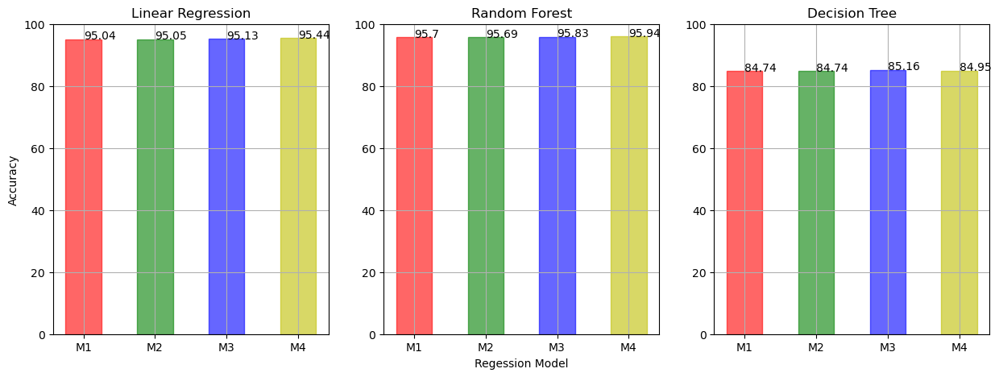

In [204]:
lr_models = ["M1", "M2", "M3", "M4"]
rf_models = ["M1", "M2", "M3", "M4"]
tree_models = ["M1", "M2", "M3", "M4"]

lr_model_accuracy = [lr_accuracy1, lr_accuracy2, lr_accuracy3, lr_accuracy4]
rf_model_accuracy = [rf_accuracy1, rf_accuracy2, rf_accuracy3, rf_accuracy4]
tree_model_accuracy = [tree_accuracy1, tree_accuracy2, tree_accuracy3, tree_accuracy4]

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],round(y[i], 2))
        
plt.figure(figsize=(15,5))
plt.subplot(1, 3, 1)
plt.title("Linear Regression")
barlist = plt.bar(lr_models, lr_model_accuracy, width=0.5, alpha=0.6)
addlabels(lr_models, lr_model_accuracy)
plt.ylim(0, 100)
barlist[0].set_color('r')
barlist[1].set_color('g')
barlist[2].set_color('b')
barlist[3].set_color('y')
plt.ylabel("Accuracy")
plt.grid()

plt.subplot(1, 3, 2)
plt.title("Random Forest")
barlist = plt.bar(rf_models, rf_model_accuracy, width=0.5, alpha=0.6)
addlabels(rf_models, rf_model_accuracy)
plt.ylim(0, 100)
barlist[0].set_color('r')
barlist[1].set_color('g')
barlist[2].set_color('b')
barlist[3].set_color('y')
plt.grid()

plt.xlabel("Regession Model")

plt.subplot(1, 3, 3)
plt.title("Decision Tree")
barlist = plt.bar(tree_models, tree_model_accuracy, width=0.5, alpha=0.6)
addlabels(tree_models, tree_model_accuracy)
plt.ylim(0, 100)
barlist[0].set_color('r')
barlist[1].set_color('g')
barlist[2].set_color('b')
barlist[3].set_color('y')

plt.grid()
plt.show()

## Final model
* From the upper caht we select the best accurate model is - <b> Random Forest<b>(Without Outliers and with Standardization)<br>

In [205]:
print("Accuracy :", rf_accuracy4)

Accuracy : 95.93971674136323
